# ***Combine Data Cleaning, Feature Selection, Modeling and Interpretability***
Combine Data Cleaning, Feature Selection, Modeling, and Interpretability into one report (Every assignment except TMINST) and make it a cohesive readable report.

The focus is readability and clarity.

The following must be answered:

What is the question?

What did you do?

How well did it work?

What did you learn?

AutoML_Assingment_Analysis_Pipeline.png

Resources

https://datavizcatalogue.com/Links to an external site.

# ***ML Data Cleaning and Feature Selection***

In this assignment, you will use a dataset for predictive learning and check the quality of the data and determine which features are important.

Answer the following questions:

* What are the data types? (Only numeric and categorical)

* Are there missing values?

* What are the likely distributions of the numeric variables?

* Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

* Which independent variables have missing data? How much?

* Do the training and test sets have the same data?

* In the predictor variables independent of all the other predictor variables?

* Which predictor variables are the most important?

* Do the ranges of the predictor variables make sense?

* What are the distributions of the predictor variables?   

* Remove outliers and keep outliers (does if have an effect of the final predictive model)?

* Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

For categorical data, calculate the accuracy and a confusion matrix.



There is an example notebook for assignment one here

 https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Abalone.ipynbLinks to an external site.

Imputation Methods for Missing Data
https://www.youtube.com/watch?v=fYhr8eF1uboLinks to an external site.

Nice EDA notebook https://www.kaggle.com/pmarcelino/comprehensive-data-exploration-with-pythonLinks to an external site.

AutoML_Assingment_Analysis_Pipeline-1.png

Scoring Rubric

Data-Supported Answers (20 Points)

1. Are your answers substantiated with relevant data?
2. You should include tables, graphs, and charts to support your evaluation/answers.

Google Colab Compatibility (5 Points)

1.Ensure your project is compatible with Google Colab.
2.Save and submit the Google Colab notebook as a .ipynb file on Canvas.

Selection and Approval of Public Dataset (5 Points)

1.Choose a public dataset suitable for Regression or Classification.
2.Obtain approval for your chosen dataset from the TAs.

Code Originality and Citation (5 Points)

1.Clearly distinguish between your original code and any adapted sources.
2.Failure to appropriately cite any code will result in zero points for this section.

Code Explanation and Professional (20 Points)

1.Your explanation of the code should be clear and concise during the code review.
2.Also make sure to include explanation in the notebook as well.
3.The clarity of your code review will be evaluated and scaled from 0 to 10 for scoring.

Licensing Clarification (5 Points)

1.Clearly state and cite the license under which your work is released.
2.Neglecting to cite a clear license will lead to zero points for this section.

Comprehensive Answers to Key Questions (40 Points)

1.Answer all the questions thoroughly which are mentioned in the requirements of the assignment.



Note: 80% of the grade will be whether the submission meets the requirements of the assignment and 20% of the assignment will depend upon how good you are able to explain the code and for professionalism.



Notes:

Normality - When we talk about normality what we mean is that the data should look like a normal distribution. This is important because several statistic tests rely on this (e.g. t-statistics). In this exercise we'll just check univariate normality for 'SalePrice' (which is a limited approach). Remember that univariate normality doesn't ensure multivariate normality (which is what we would like to have), but it helps. Another detail to take into account is that in big samples (>200 observations) normality is not such an issue. However, if we solve normality, we avoid a lot of other problems (e.g. heteroscedacity) so that's the main reason why we are doing this analysis.

Homoscedasticity - I just hope I wrote it right. Homoscedasticity refers to the 'assumption that dependent variable(s) exhibit equal levels of variance across the range of predictor variable(s)' (Hair et al., 2013)Links to an external site.. Homoscedasticity is desirable because we want the error term to be the same across all values of the independent variables.

Linearity- The most common way to assess linearity is to examine scatter plots and search for linear patterns. If patterns are not linear, it would be worthwhile to explore data transformations. However, we'll not get into this because most of the scatter plots we've seen appear to have linear relationships.

Absence of correlated errors - Correlated errors, like the definition suggests, happen when one error is correlated to another. For instance, if one positive error makes a negative error systematically, it means that there's a relationship between these variables. This occurs often in time series, where some patterns are time related. We'll also not get into this. However, if you detect something, try to add a variable that can explain the effect you're getting. That's the most common solution for correlated errors.

In [ ]:
# installing dependencies
!pip install eli5


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107717 sha256=76a441b7e9865fe367f79a61868aa738611bfa95b4296319b1eb2920f5432920
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot

In [ ]:
# Reading the customer segmentation dataset
data = pd.read_csv(
    "customer_segmentation.csv"
)

In [ ]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [ ]:
data
#checking if any data is missing

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


What are the data types? (Only numeric and categorical)

In [ ]:
data.dtypes

ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object

So there are 3 categorical data types and 26 numerical data types.

 Are there missing values?

In [ ]:
data.isna().sum()


ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

Yes, the Income Feature has 24 columns of missing data

In [ ]:
mean = data["Income"].mean()
data["Income"].fillna(mean, inplace=True)
data.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

 What are the likely distributions of the numeric variables?

<Figure size 800x500 with 0 Axes>

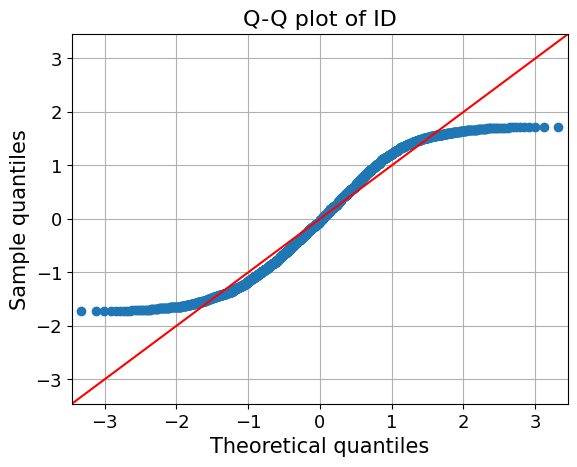

<Figure size 800x500 with 0 Axes>

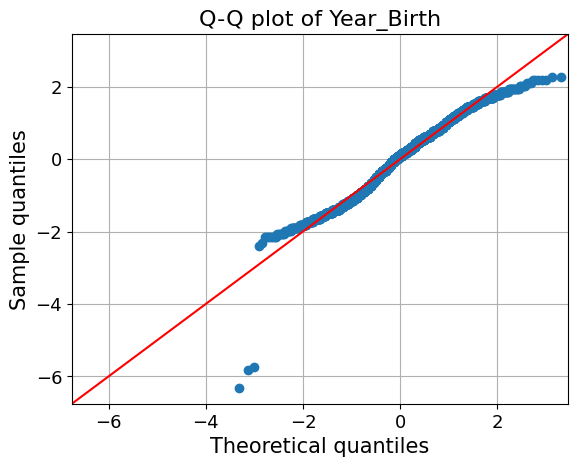

<Figure size 800x500 with 0 Axes>

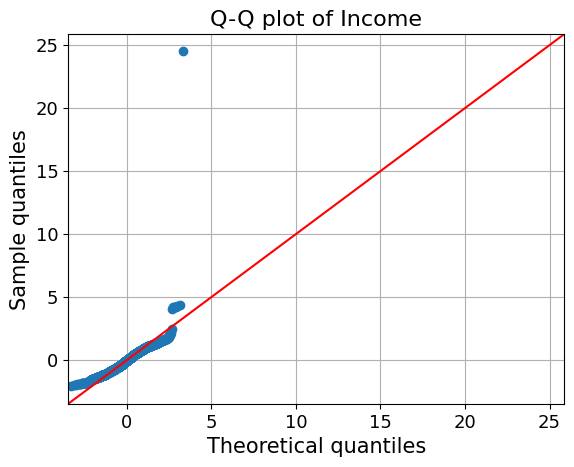

<Figure size 800x500 with 0 Axes>

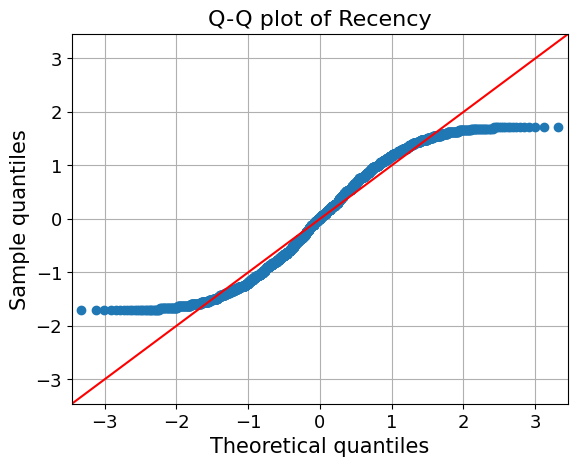

<Figure size 800x500 with 0 Axes>

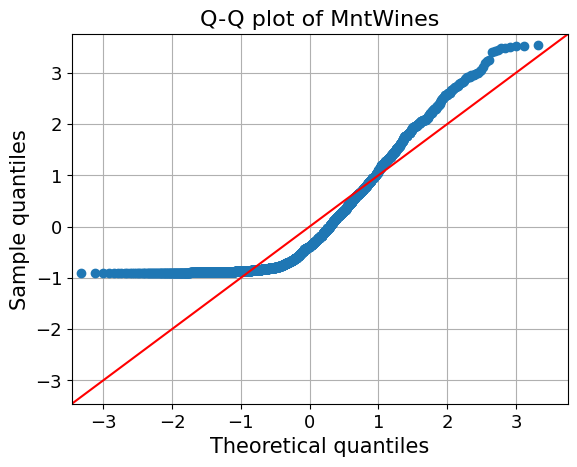

<Figure size 800x500 with 0 Axes>

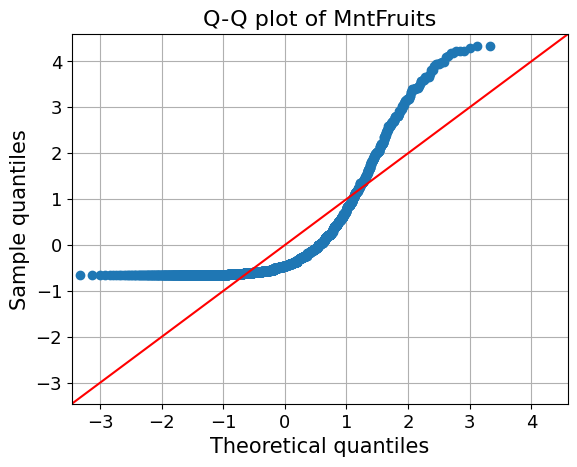

<Figure size 800x500 with 0 Axes>

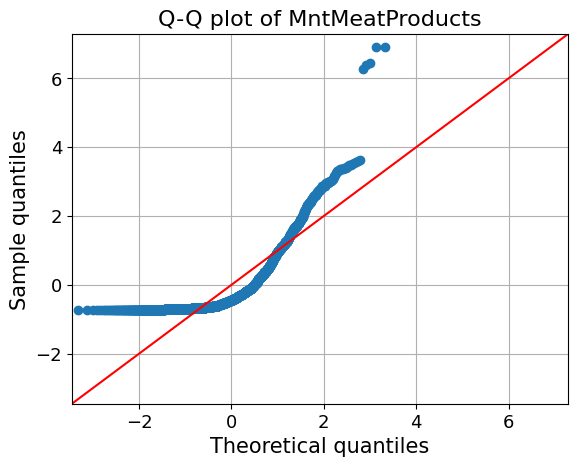

<Figure size 800x500 with 0 Axes>

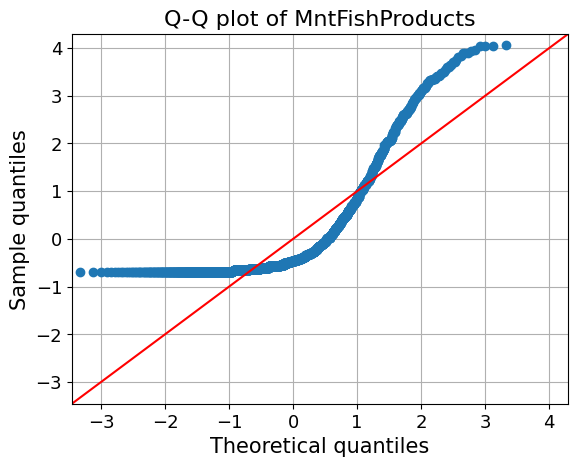

<Figure size 800x500 with 0 Axes>

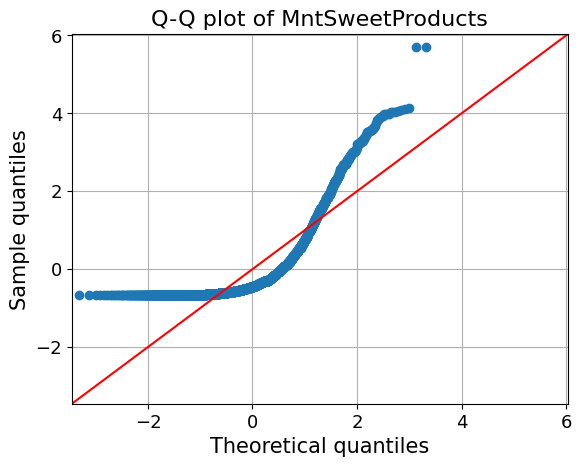

<Figure size 800x500 with 0 Axes>

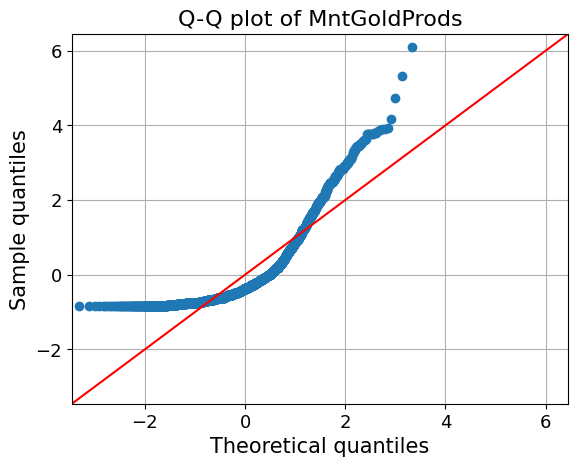

<Figure size 800x500 with 0 Axes>

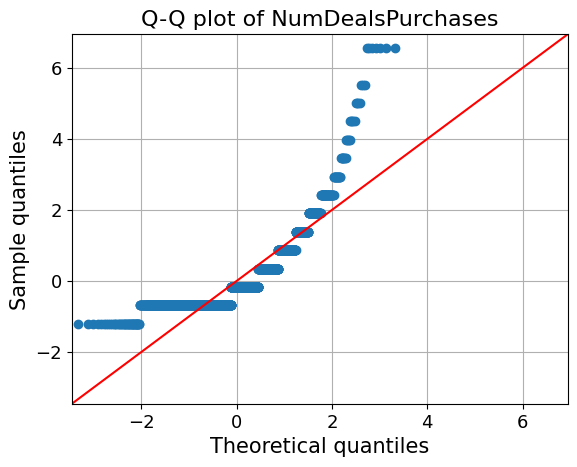

<Figure size 800x500 with 0 Axes>

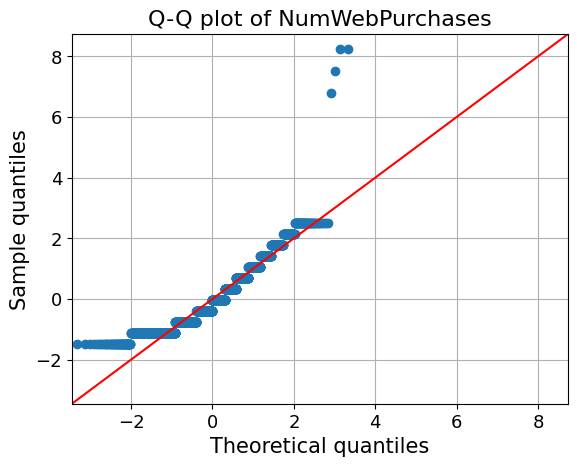

<Figure size 800x500 with 0 Axes>

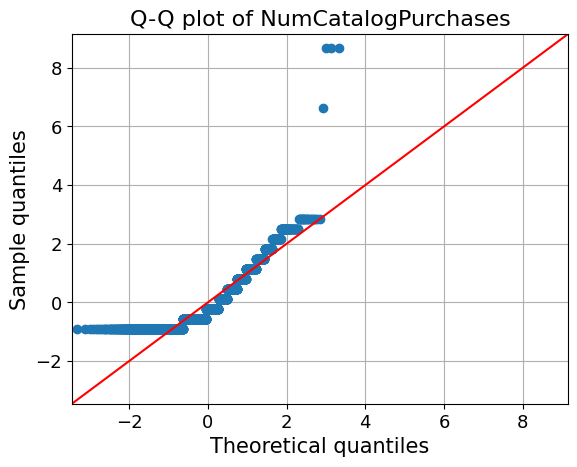

<Figure size 800x500 with 0 Axes>

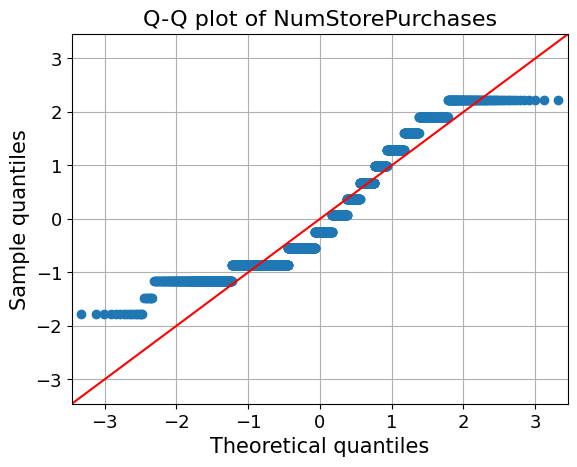

<Figure size 800x500 with 0 Axes>

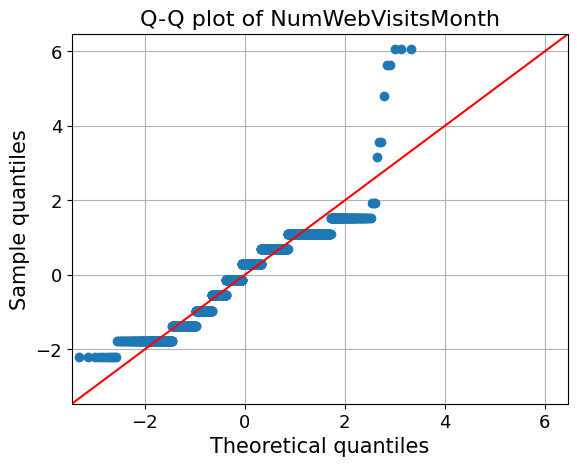

<Figure size 800x500 with 0 Axes>

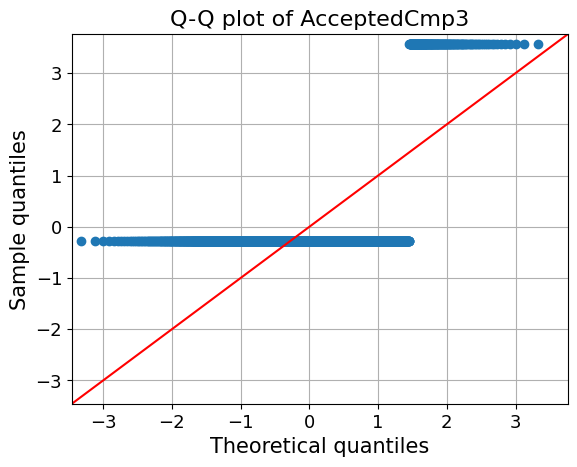

<Figure size 800x500 with 0 Axes>

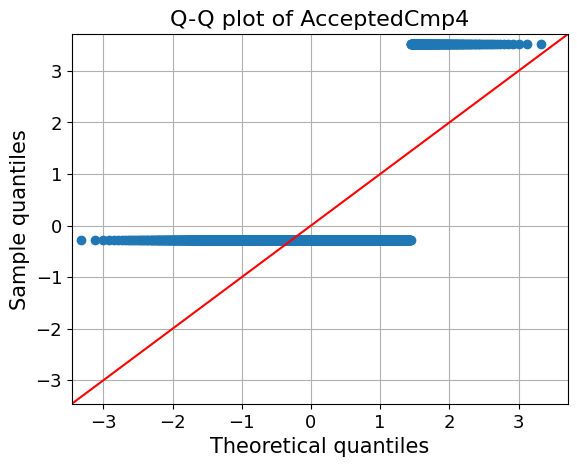

<Figure size 800x500 with 0 Axes>

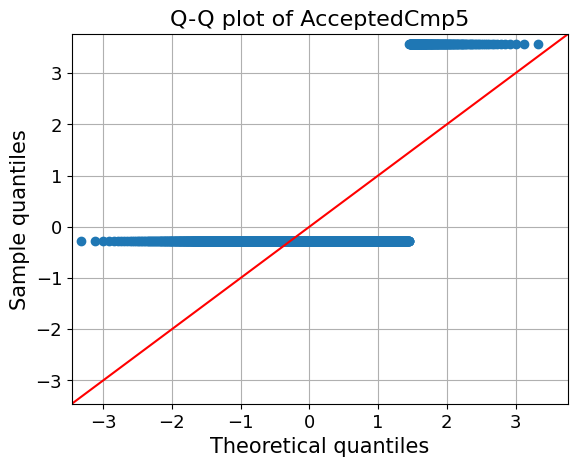

<Figure size 800x500 with 0 Axes>

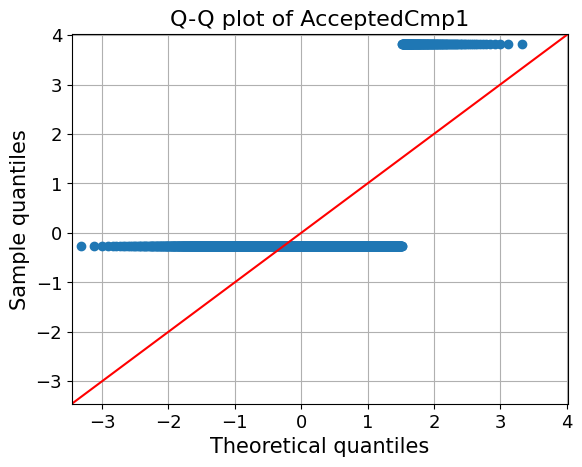

<Figure size 800x500 with 0 Axes>

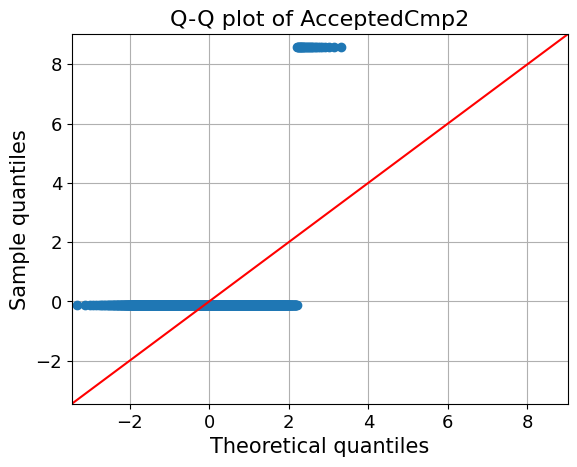

<Figure size 800x500 with 0 Axes>

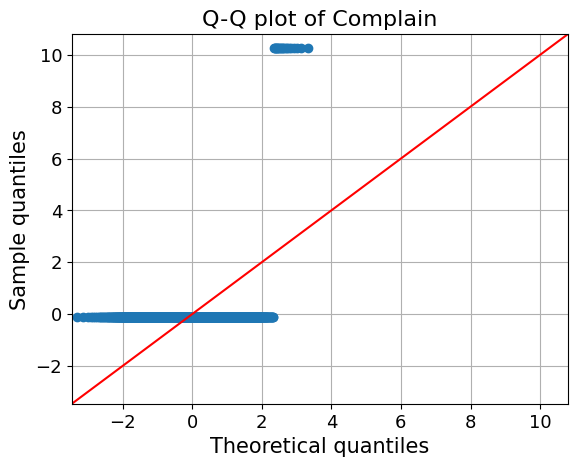

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/gofplots.py:282: RuntimeWarning: invalid value encountered in divide
  return (self.sorted_data - self.loc) / self.scale


<Figure size 800x500 with 0 Axes>

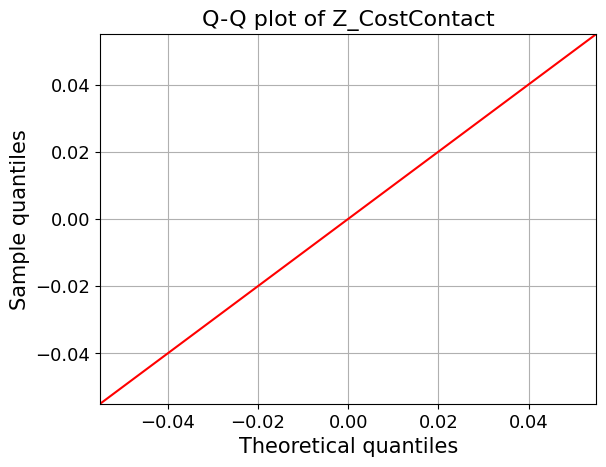

<Figure size 800x500 with 0 Axes>

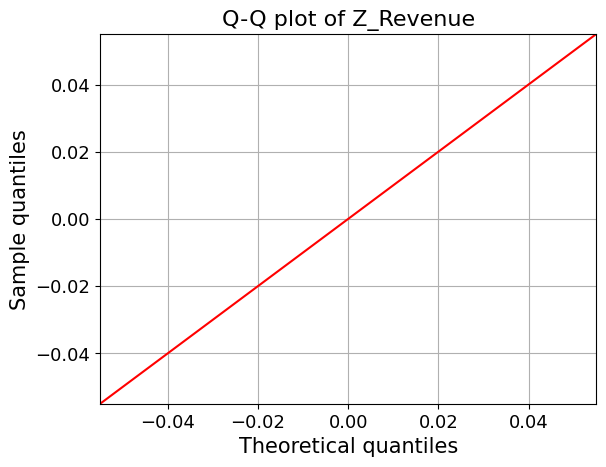

<Figure size 800x500 with 0 Axes>

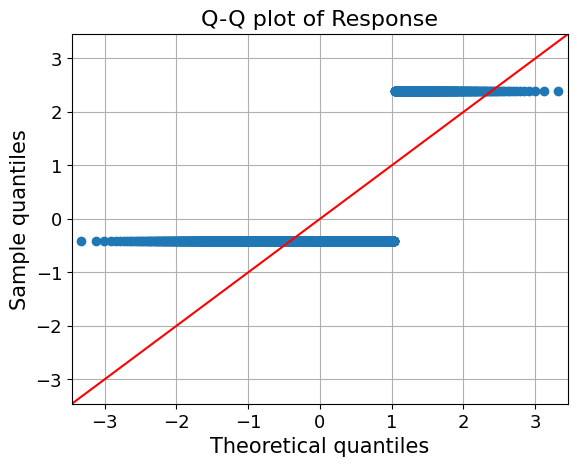

In [ ]:
# checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot

data_norm = data[["ID", "Year_Birth", "Income", "Recency", "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "AcceptedCmp1", "AcceptedCmp2", "Complain", "Z_CostContact", "Z_Revenue", "Response"]
]
for c in data_norm.columns[:]:
    plt.figure(figsize=(8, 5))
    fig = qqplot(data_norm[c], line="45", fit="True")
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("Sample quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

<Axes: >

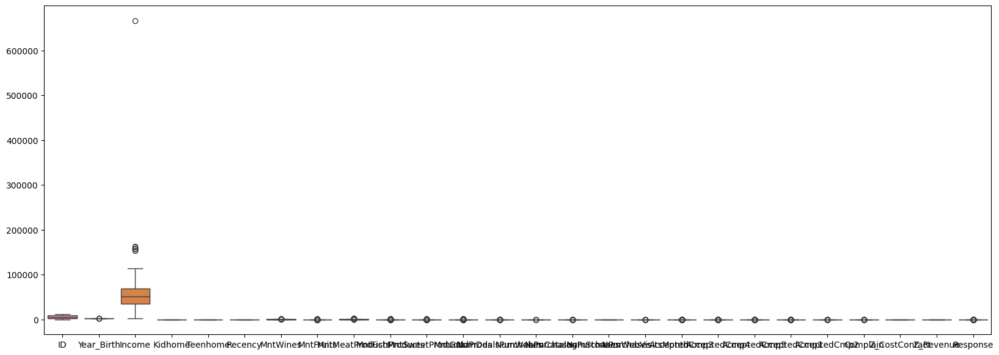

In [ ]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

In [ ]:
# Creating binary vaiables for


# data = pd.get_dummies(data)
# data.drop(["Dt_Customer"],axis=1,inplace= True)
# Normalizing the data in the rings column beacuse the value is too high when compared to other independent variable

from sklearn import preprocessing
data = pd.read_csv(
    "customer_segmentation.csv"
)

# Create x to store scaled values as floats
x = data[["Income"]].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
data[["Income"]] = pd.DataFrame(x_scaled)

In [ ]:
# data after nromalizing and feature creation
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,0.084832,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,0.067095,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,0.105097,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,0.037471,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,0.085065,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


<Axes: >

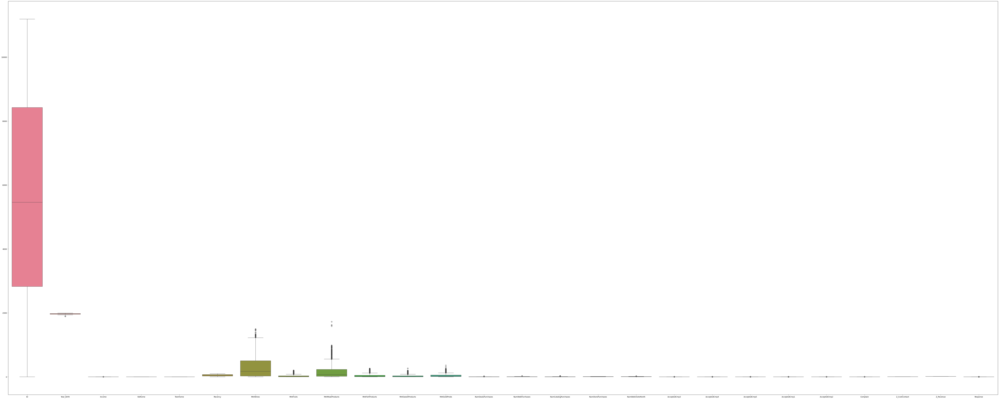

In [ ]:
# Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(100, 40))
sns.boxplot(data=data)

In [ ]:
# checking the correlation between all the features in the data
data.corr()

<ipython-input-14-38a63e203d79>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.corr()


,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
ID,1.000000,0.000028,0.013095,0.002406,-0.002580,-0.046524,-0.022878,0.004600,-0.004437,-0.024475,...,-0.007446,-0.036040,-0.025387,-0.007517,-0.021614,-0.015061,0.033883,NaN,NaN,-0.021968
Year_Birth,0.000028,1.000000,-0.161791,0.230176,-0.352111,-0.019871,-0.157773,-0.017917,-0.030872,-0.041625,...,0.121139,0.061774,-0.060510,0.007123,-0.005930,-0.006539,-0.030128,NaN,NaN,0.021325
Income,0.013095,-0.161791,1.000000,-0.428669,0.019133,-0.003970,0.578650,0.430842,0.584633,0.438871,...,-0.553088,-0.016174,0.184400,0.335943,0.276820,0.087545,-0.027225,NaN,NaN,0.133047
Kidhome,0.002406,0.230176,-0.428669,1.000000,-0.036133,0.008827,-0.496297,-0.372581,-0.437129,-0.387644,...,0.447846,0.014674,-0.161600,-0.205634,-0.172339,-0.081716,0.040207,NaN,NaN,-0.080008
Teenhome,-0.002580,-0.352111,0.019133,-0.036133,1.000000,0.016198,0.004846,-0.176764,-0.261160,-0.204187,...,0.134884,-0.042677,0.038886,-0.191050,-0.140090,-0.015605,0.003138,NaN,NaN,-0.154446
Recency,-0.046524,-0.019871,-0.003970,0.008827,0.016198,1.000000,0.016064,-0.004306,0.023056,0.001079,...,-0.021445,-0.032991,0.018826,0.000129,-0.019283,-0.001781,0.013231,NaN,NaN,-0.198437
MntWines,-0.022878,-0.157773,0.578650,-0.496297,0.004846,0.016064,1.000000,0.389637,0.562667,0.399753,...,-0.320653,0.062202,0.373286,0.472613,0.354133,0.205907,-0.039007,NaN,NaN,0.247254
MntFruits,0.004600,-0.017917,0.430842,-0.372581,-0.176764,-0.004306,0.389637,1.000000,0.543105,0.594804,...,-0.418383,0.014727,0.010152,0.215833,0.194748,-0.009773,-0.005166,NaN,NaN,0.125289
MntMeatProducts,-0.004437,-0.030872,0.584633,-0.437129,-0.261160,0.023056,0.562667,0.543105,1.000000,0.568402,...,-0.539470,0.018272,0.102912,0.373769,0.309761,0.043033,-0.023483,NaN,NaN,0.236335
MntFishProducts,-0.024475,-0.041625,0.438871,-0.387644,-0.204187,0.001079,0.399753,0.594804,0.568402,1.000000,...,-0.446003,0.000357,0.016843,0.199578,0.260762,0.002577,-0.020953,NaN,NaN,0.111331


<ipython-input-15-0d33ea995755>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap="RdYlGn")


<Axes: >

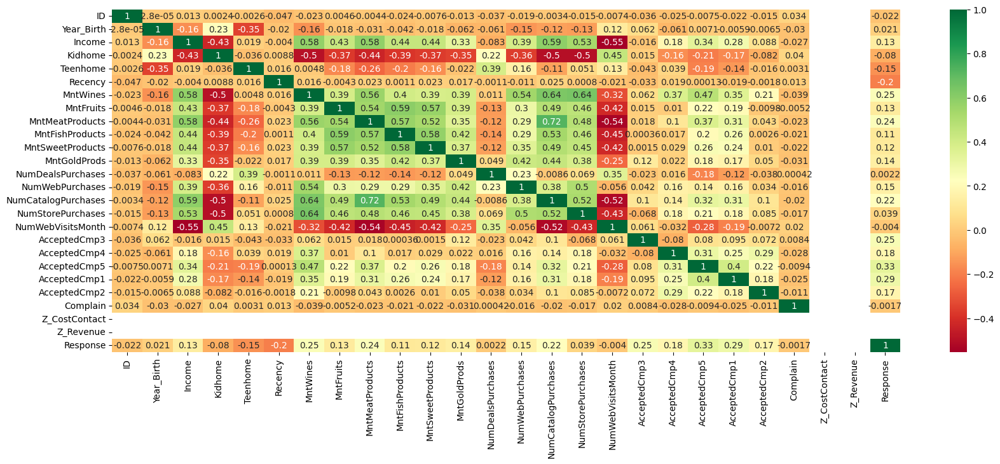

In [ ]:

# the heat map of the correlation
plt.figure(figsize=(20, 7))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn")


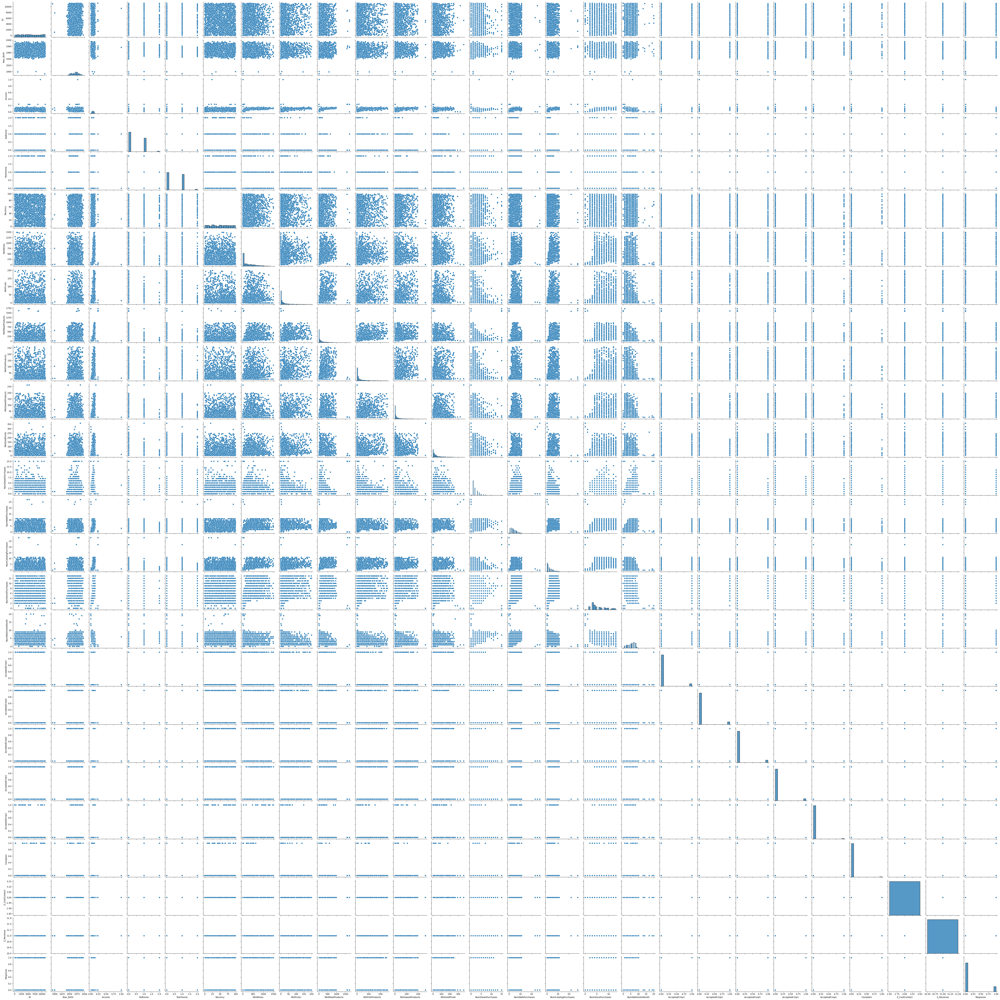

In [ ]:
# pair plot to check the colinearity
sns.pairplot(data)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [ ]:
print("Total categories in the feature Marital_Status:\n", data["Marital_Status"].value_counts(), "\n")
print("Total categories in the feature Education:\n", data["Education"].value_counts())

Total categories in the feature Marital_Status:
 Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64 

Total categories in the feature Education:
 Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64


 Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

For a regression model, the most useful Independent Variables can be statistically determined using the following methods:

Univariate Selection
Feature Importance
Correlation Matrix with Heatmap
Each of the following method is applied below to the dataset.


In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
X = data.iloc[:,0:8]
y = data.iloc[:,-1]
y=y.astype('int')
# y = pd.DataFrame(y)
y.head(10)
y.describe()

count    2240.000000
mean        0.149107
std         0.356274
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Response, dtype: float64

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load the data (assuming it's stored in a DataFrame named 'data')
# Handle missing values and encode categorical variables if needed

# Separate features (X) and target variable (y)
X = data.drop('Response', axis=1)
y = data['Response']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Method 1: Correlation Analysis
correlation_matrix = data.corr()
correlation_with_target = correlation_matrix['Response'].abs().sort_values(ascending=False)
print("Correlation Analysis:\n", correlation_with_target)

# Method 2: Feature Importance from Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
feature_importance = pd.Series(rf_model.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nRandom Forest Feature Importance:\n", feature_importance)

# Method 3: Recursive Feature Elimination with Logistic Regression
logreg_model = LogisticRegression(random_state=42)
rfe = RFE(logreg_model, n_features_to_select=1)
rfe.fit(X_train, y_train)
selected_features = pd.DataFrame({'Feature': X.columns, 'Ranking': rfe.ranking_})
selected_features = selected_features.sort_values(by='Ranking')
print("\nRecursive Feature Elimination:\n", selected_features)


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder

# Load the data
data = pd.read_csv("customer_segmentation.csv")

# Check for missing values
missing_values = data.isnull().sum()

# If there are missing values, impute them using appropriate techniques
# ...

# Identify non-numeric columns
non_numeric_columns = data.select_dtypes(include=["object"]).columns

# Encode non-numeric columns using one-hot encoding
encoder = OneHotEncoder(handle_unknown="ignore")
encoded_data = pd.concat([data.drop(non_numeric_columns, axis=1),
                           pd.DataFrame(encoder.fit_transform(data[non_numeric_columns]).toarray())], axis=1)

# Separate features and target variable
X = encoded_data.drop("Response", axis=1)
y = encoded_data["Response"]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Method 1: Correlation Analysis
correlation_matrix = data.corr()
correlation_with_target = correlation_matrix["Response"].abs().sort_values(ascending=False)
print("Correlation Analysis:\n", correlation_with_target)

# Method 2: Feature Importance from Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
feature_importance = pd.Series(rf_model.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nRandom Forest Feature Importance:\n", feature_importance)

# Method 3: Recursive Feature Elimination with Logistic Regression
logreg_model = LogisticRegression(random_state=42)
rfe = RFE(logreg_model, n_features_to_select=1)
rfe.fit(X_train, y_train)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train.shape,X_test.shape

((1568, 23), (672, 23))

In [ ]:
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize = (20,20))
#plot heatmap
g = sns.heatmap(data[top_corr_features].corr(), annot= True)

Do the training and test sets have the same data?

In [ ]:
from sklearn.model_selection import train_test_split

X = data[
    [
        "ID", "Year_Birth", "Income", "Recency", "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "AcceptedCmp1", "AcceptedCmp2", "Complain", "Z_CostContact", "Z_Revenue"
    ]
]

y = data["Response"]

# Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(
    X_t, y_t, test_size=0.15, random_state=1
)

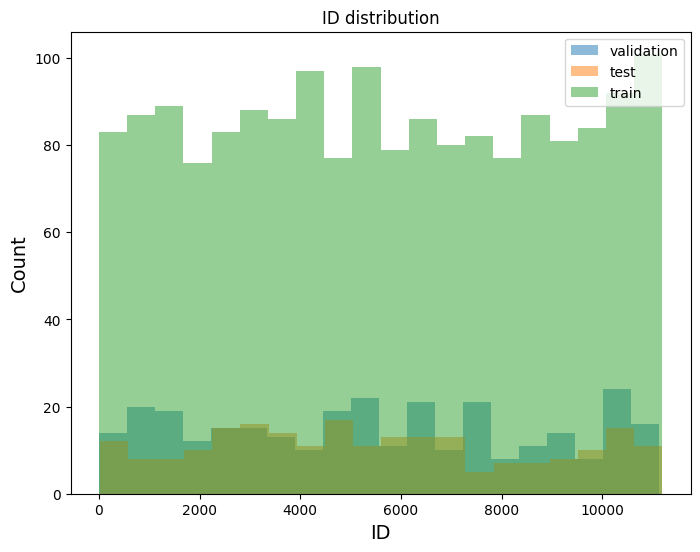

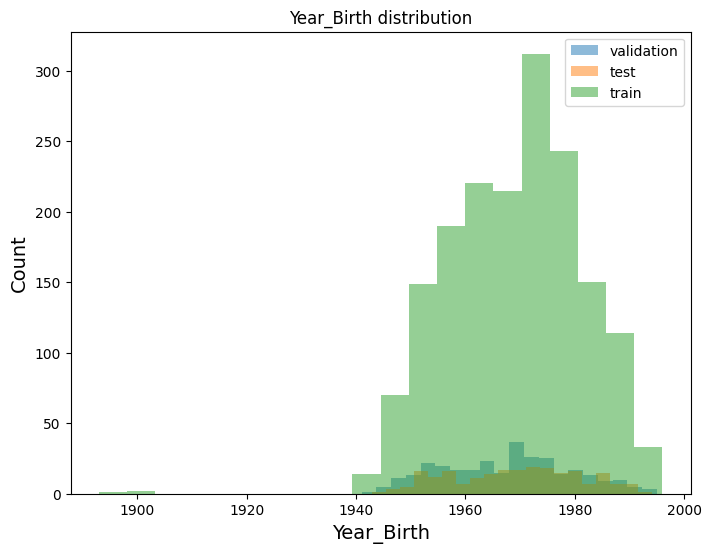

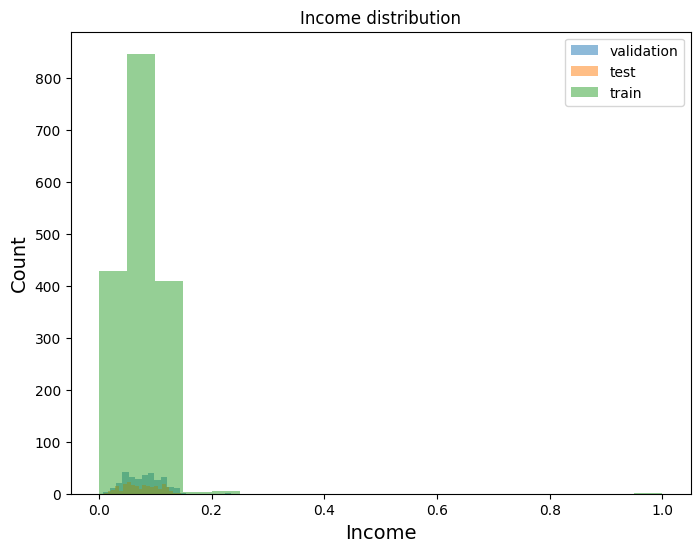

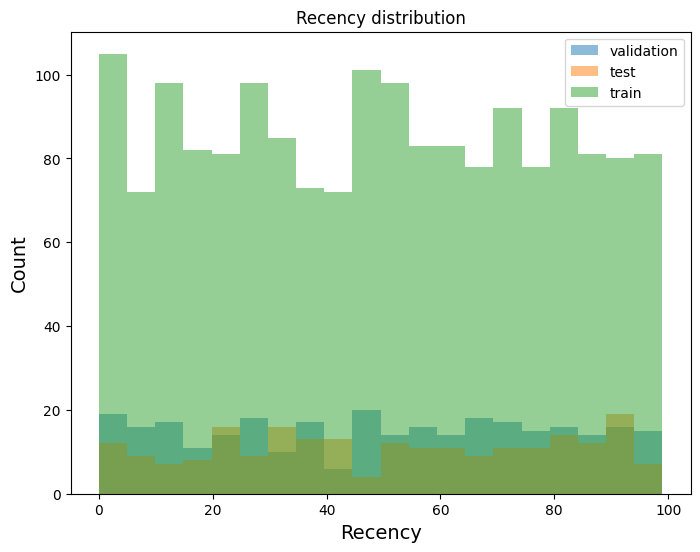

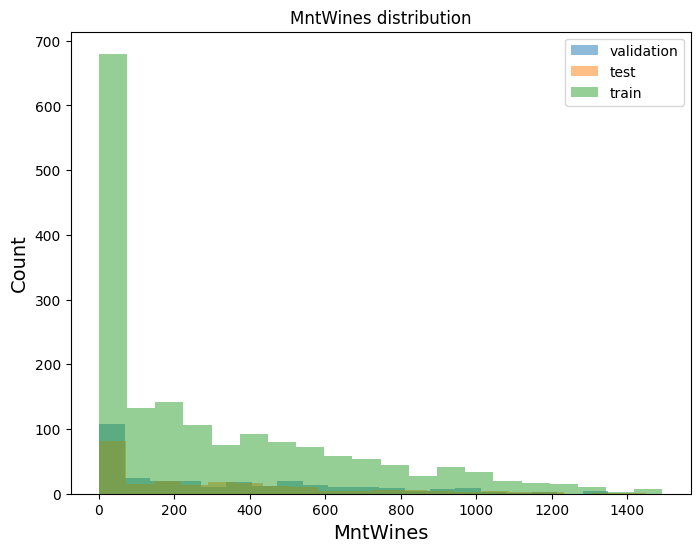

...

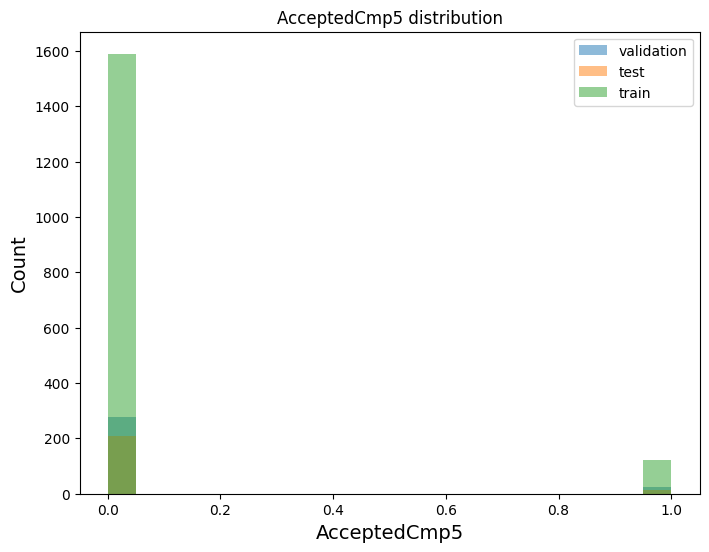

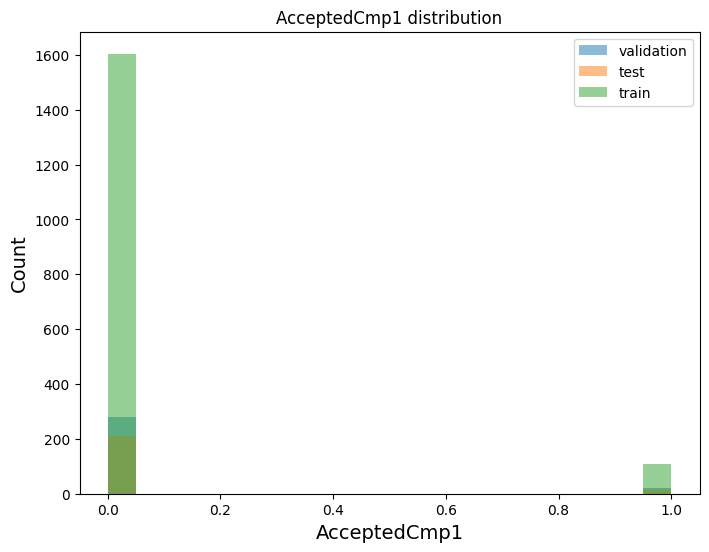

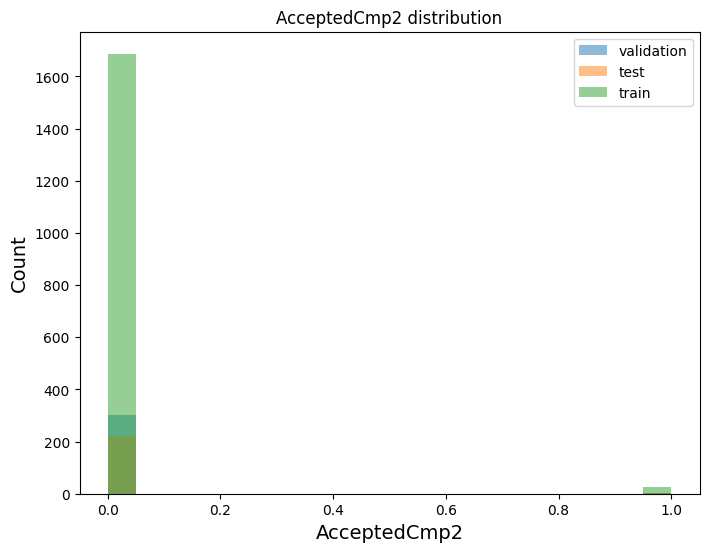

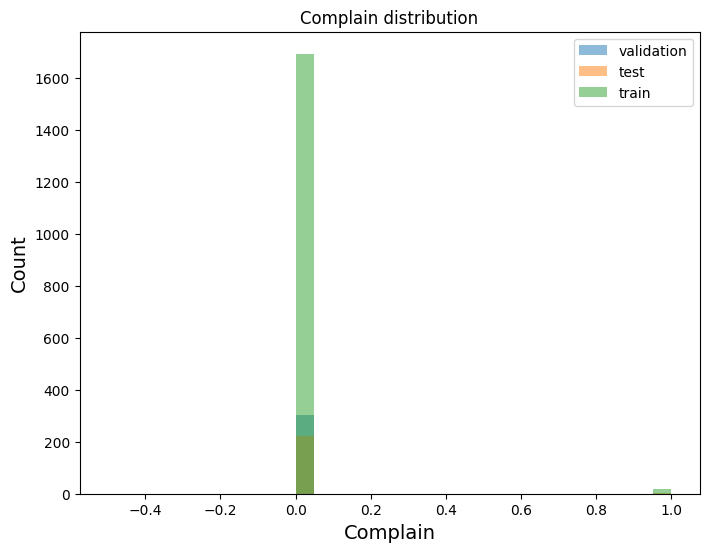

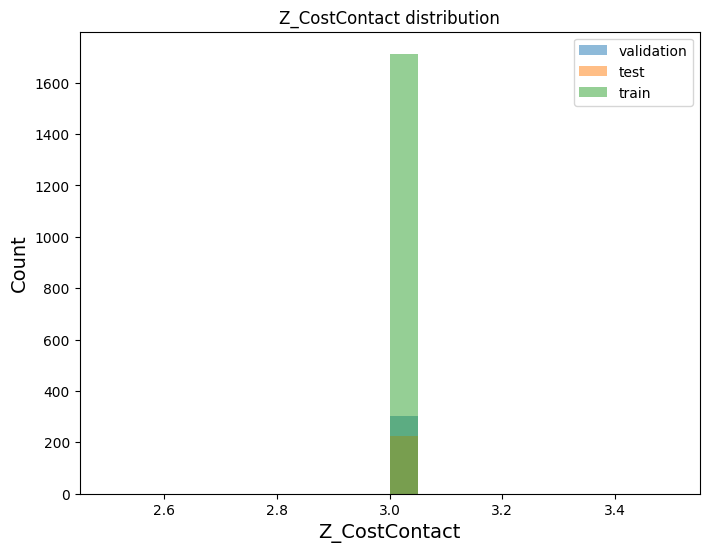

In [ ]:
# Looking the data for test, training and validation set
X_test_plot = X_test[
    [
         "ID", "Year_Birth", "Income", "Recency", "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "AcceptedCmp1", "AcceptedCmp2", "Complain", "Z_CostContact"
    ]
]

X_val_plot = X_val[
    [
        "ID", "Year_Birth", "Income", "Recency", "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "AcceptedCmp1", "AcceptedCmp2", "Complain", "Z_CostContact"
    ]
]

X_train_plot = X_train[
    [
        "ID", "Year_Birth", "Income", "Recency", "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "AcceptedCmp1", "AcceptedCmp2", "Complain", "Z_CostContact"
    ]
]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
    plt.figure(figsize=(8, 6))
    plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
    plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
    plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
    plt.xlabel(c, size=14)
    plt.ylabel("Count", size=14)
    plt.legend(loc="upper right")
    plt.title("{} distribution".format(c))
    plt.show()

 In the predictor variables independent of all the other predictor variables?

In [ ]:
data_encoded.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,2,4,0.084832,0,0,80,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,2,4,0.067095,1,1,157,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,2,5,0.105097,0,0,444,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,2,5,0.037471,1,0,199,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,4,3,0.085065,1,0,390,94,173,...,5,0,0,0,0,0,0,3,11,0


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Assuming df is your DataFrame containing the NBA players data

# Define categorical columns
categorical_cols = ['Education', 'Marital_Status', 'Dt_Customer']

# Create a copy of the DataFrame to avoid modifying the original data
data_encoded = data.copy()

# Apply label encoding to each categorical column
label_encoder = LabelEncoder()
for col in categorical_cols:
    data_encoded[col] = label_encoder.fit_transform(data[col])

# Now df_encoded contains the label encoded categorical variables
print(data_encoded.head())

     ID  Year_Birth  Education  Marital_Status    Income  Kidhome  Teenhome  \
0  5524        1957          2               4  0.084832        0         0   
1  2174        1954          2               4  0.067095        1         1   
2  4141        1965          2               5  0.105097        0         0   
3  6182        1984          2               5  0.037471        1         0   
4  5324        1981          4               3  0.085065        1         0   

   Dt_Customer  Recency  MntWines  ...  NumWebVisitsMonth  AcceptedCmp3  \
0           80       58       635  ...                  7             0   
1          157       38        11  ...                  5             0   
2          444       26       426  ...                  4             0   
3          199       26        11  ...                  6             0   
4          390       94       173  ...                  5             0   

   AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  Complain  \
0  

 Is the predictor variables independent of all the other predictor variables?

In [ ]:
import statsmodels.api as sm

# Filter out only the numerical columns
numerical_columns = data_encoded.select_dtypes(include=['float64', 'int64']).columns

# Define the dependent variable (target)
dependent_variable = "Response"

# Define the independent variables (numerical features)
independent_variables = [col for col in numerical_columns if col != dependent_variable]

# Fit the OLS regression model
model = sm.OLS(data_encoded[dependent_variable], data_encoded[independent_variables]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Response   R-squared:                       0.293
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     34.82
Date:                Tue, 30 Jan 2024   Prob (F-statistic):          8.01e-144
Time:                        02:01:24   Log-Likelihood:                -480.43
No. Observations:                2216   AIC:                             1015.
Df Residuals:                    2189   BIC:                             1169.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
ID                  -1.432e-06   1.99e-06     -0.720      0.472   -5.33e-06    2.47e-06
Year_Birth             -0.0004      0.001     -0.640      0.522      -0.002       0.001
Education               0.0298      0.006      4.804      0.000       0.018       0.042
Marital_Status         -0.0029      0.006     -0.491      0.624      -0.015       0.009
Income                 -0.1427      0.253     -0.565      0.572      -0.638       0.353
Kidhome                -0.0033      0.016     -0.202      0.840      -0.036       0.029
Teenhome               -0.0672      0.015     -4.497      0.000      -0.097      -0.038
Dt_Customer         -1.444e-05    3.4e-05     -0.425      0.671   -8.11e-05    5.22e-05
Recency                -0.0024      0.000    -10.701      0.000      -0.003      -0.002
MntWines             -1.03e-06   3.56e-05     -0.029      0.977   -7.08e-05    6.87e-05
MntFruits               0.0003      0.000      1.497      0.135      -0.000       0.001
MntMeatProducts         0.0003      5e-05      5.106      0.000       0.000       0.000
MntFishProducts        -0.0001      0.000     -0.614      0.540      -0.000       0.000
MntSweetProducts      7.99e-05      0.000      0.366      0.714      -0.000       0.001
MntGoldProds            0.0003      0.000      1.801      0.072   -2.46e-05       0.001
NumDealsPurchases       0.0127      0.004      2.930      0.003       0.004       0.021
NumWebPurchases         0.0085      0.003      2.578      0.010       0.002       0.015
NumCatalogPurchases     0.0048      0.004      1.232      0.218      -0.003       0.012
NumStorePurchases      -0.0159      0.003     -5.180      0.000      -0.022      -0.010
NumWebVisitsMonth       0.0174      0.004      4.290      0.000       0.009       0.025
AcceptedCmp3            0.2564      0.026      9.883      0.000       0.206       0.307
AcceptedCmp4            0.1214      0.029      4.220      0.000       0.065       0.178
AcceptedCmp5            0.2371      0.032      7.512      0.000       0.175       0.299
AcceptedCmp1            0.1958      0.030      6.450      0.000       0.136       0.255
AcceptedCmp2            0.2040      0.060      3.412      0.001       0.087       0.321
Complain                0.0530      0.067      0.794      0.427      -0.078       0.184
Z_CostContact           0.0190      0.027      0.693      0.488      -0.035       0.073
Z_Revenue               0.0697      0.101      0.693      0.488      -0.127       0.267
==============================================================================
Omnibus:                      504.412   Durbin-Watson:                   2.037
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1023.405
Skew:                           1.334   Prob(JB):                    5.89e-223
Kurtosis:                       4.992  

**Which predictor variables are the most important?**

Answer: The predictor value with p value below 0.5 are the most important.

In [ ]:
Q) Do the ranges of the predictor variables make sense?

Indeed, the predictor variable ranges make sense because they are clearly defined and follow the recommended units of the researchers who took the recordings.

What are the distributions of the predictor variables?   

 Q) Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error?

In [ ]:
df_imputation= data[['Response']]
df_imputation['1_percent'] = df_imputation[['Response']]
df_imputation['5_percent'] = df_imputation[['Response']]
df_imputation['10_percent'] = df_imputation[['Response']]
# df_imputation['sample_num'] = df_imputation[['Unnamed: 0']]
# df_imputation['sample_num'] = df_imputation['sample_num']/1000
df_imputation.head()

<ipython-input-53-5d9e37266e3f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imputation['1_percent'] = df_imputation[['Response']]
<ipython-input-53-5d9e37266e3f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imputation['5_percent'] = df_imputation[['Response']]
<ipython-input-53-5d9e37266e3f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas

,Response,1_percent,5_percent,10_percent
0,1,1,1,1
1,0,0,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0


# **Consolidated Questions & Answers - Assignment 1**


**Q1 What are the data types? (Only numeric and categorical)**

A1 There are 3 categorical data types and 26 numerical data types.

**Q2 Are there missing values?**

A2 Yes


**Q3 What are the likely distributions of the numeric variables?**

A3
To understand the likely distributions of the numeric variables in your dataset, using Q-Q plots and analyzing box plots are insightful approaches. Q-Q plots help compare the distribution of a variable with a theoretical distribution, usually the normal distribution, by plotting their quantiles against each other. If the points roughly follow the line y = x, then the variable can be considered normally distributed.

Based on the methods you've used (Q-Q plots and box plots), if your numeric variables show points closely following the 45-degree line in the Q-Q plots, they are likely normally distributed or close to it. The box plots provide insights into the variables' central tendency, dispersion, and the presence of outliers, but do not directly inform about the distribution's shape. Variables with symmetric box plots might hint at a normal distribution, while skewed box plots suggest otherwise. However, without seeing the actual plots or having specific results (e.g., skewness, kurtosis measures), it's difficult to pinpoint the exact distribution of each variable.

In general, customer data like income, recency, and purchase amounts often follow skewed distributions, as a large number of customers might make small purchases while a few make very large purchases.

**Q4 Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)**

A4 For determining the most useful independent variables for a regression model, three methods are applied: Univariate Selection, Feature Importance, and Correlation Matrix with Heatmap. Univariate Selection identifies variables that have a strong relationship with the response variable through statistical tests. Feature Importance, derived from models like Random Forest, ranks variables based on their impact on model performance. The Correlation Matrix with Heatmap visually represents the strength and direction of relationships between variables, highlighting those most correlated with the target variable. Together, these methods provide a comprehensive view of the variables most relevant to predicting the model's outcome.

**Q5 Which independent variables have missing data? How much?**

A5 Income independent variable has missing data.

**Q6 Do the training and test sets have the same data?**

A6 The training, validation, and test sets do not contain the same data but are parts of the dataset split to serve different purposes in model development. The splitting process ensures that models are trained on a separate portion of the data (training set), fine-tuned with another segment (validation set), and finally evaluated on unseen data (test set). This approach helps in assessing the model's ability to generalize to new data. The histograms for various features across the three sets should ideally show similar distributions, indicating that the split was done in a way that maintains the overall data distribution across each set.

**Q7 In the predictor variables independent of all the other predictor variables?**

A7 In the provided code, an Ordinary Least Squares (OLS) regression model is fitted using statsmodels, with one dependent variable (Response) and multiple independent variables. The independence of predictor variables, also known as multicollinearity, is not directly tested through this OLS model fitting. While OLS regression can provide insights into the relationships between the dependent variable and each independent variable, evaluating the independence of predictors requires specific multicollinearity tests, such as Variance Inflation Factor (VIF) analysis. The OLS summary might show significance levels and coefficients for predictors, but assessing their independence requires further statistical tests beyond what is shown.

**Q8 Which predictor variables are the most important?**

A8 From the OLS regression results, the most important predictor variables can be identified based on their p-values and coefficients. Variables with low p-values (<0.05) are considered statistically significant, indicating a strong evidence of association with the dependent variable "Response." Here are the significant predictors based on the summary:

Education: Coefficient = 0.0298, p-value = 0.000. Indicates a positive relationship with the response.
Teenhome: Coefficient = -0.0672, p-value = 0.000. Indicates a negative relationship with the response.
Recency: Coefficient = -0.0024, p-value = 0.000. Indicates a negative relationship with the response.
MntMeatProducts: Coefficient = 0.0003, p-value = 0.000. Indicates a positive relationship with the response.
NumDealsPurchases: Coefficient = 0.0127, p-value = 0.003. Indicates a positive relationship with the response.
NumWebPurchases: Coefficient = 0.0085, p-value = 0.010. Indicates a positive relationship with the response.
NumStorePurchases: Coefficient = -0.0159, p-value = 0.000. Indicates a negative relationship with the response.
NumWebVisitsMonth: Coefficient = 0.0174, p-value = 0.000. Indicates a positive relationship with the response.
AcceptedCmp3: Coefficient = 0.2564, p-value = 0.000. Indicates a strong positive relationship with the response.
AcceptedCmp4: Coefficient = 0.1214, p-value = 0.000. Indicates a positive relationship with the response.
AcceptedCmp5: Coefficient = 0.2371, p-value = 0.000. Indicates a strong positive relationship with the response.
AcceptedCmp1: Coefficient = 0.1958, p-value = 0.000. Indicates a positive relationship with the response.
AcceptedCmp2: Coefficient = 0.2040, p-value = 0.001. Indicates a positive relationship with the response.
These variables show significant statistical evidence of influencing the response variable, either positively or negatively. Variables like AcceptedCmp3, AcceptedCmp5, AcceptedCmp1, and AcceptedCmp2 show particularly strong associations, suggesting that these campaigns had a noticeable impact on the response variable.


In the regression analysis, statistically significant predictor variables were identified based on their p-values and coefficients. Significant predictors include Education, Teenhome, Recency, MntMeatProducts, NumDealsPurchases, NumWebPurchases, NumStorePurchases, NumWebVisitsMonth, and campaign acceptance variables (AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2). These variables demonstrate a measurable impact on the response, with campaign variables showing particularly strong positive associations. This implies that the acceptance of marketing campaigns is a major driver of the response variable, alongside customer demographics and purchasing behaviors.



**Q9 Do the ranges of the predictor variables make sense?**

A9 The ranges of predictor variables in the context of OLS regression results are understood through the coefficients and the statistical significance (p-values) of these coefficients. From the regression output provided, the predictor variables with statistically significant p-values (typically <0.05) indicate a meaningful contribution to the model. These include Education, Teenhome, Recency, MntMeatProducts, NumDealsPurchases, NumWebPurchases, NumStorePurchases, NumWebVisitsMonth, and the AcceptedCmp variables (3, 4, 5, 1, 2). The coefficients of these variables suggest their individual impact per unit change on the dependent variable, Response.

The reported ranges (coefficients) indeed make sense in the context of their expected influence on customer response. For example, Recency has a negative coefficient, implying that more recent interactions with the company are likely to increase the likelihood of a positive response, which aligns with marketing logic. Similarly, the positive coefficients for AcceptedCmp variables indicate that acceptance of certain campaigns is positively associated with the response, which is intuitive.

However, the note about the smallest eigenvalue being close to zero and the model's condition number being very high indicates potential multicollinearity issues among the predictor variables. Multicollinearity refers to situations where predictor variables are highly correlated with one another, which can distort the importance of individual predictors and inflate their variances. Thus, while the coefficient ranges make sense and significant predictors are identified, caution must be exercised in interpreting these results due to underlying multicollinearity, which could affect the reliability of the model's estimates.

**Q10 What are the distributions of the predictor variables? **  

A10 The regression output provided doesn't directly reveal the distributions of predictor variables; however, we can employ several statistical methods and visualization techniques to deduce these distributions. For continuous variables such as Income, Year_Birth, and amounts spent on various products (MntWines, MntMeatProducts, etc.), histograms or density plots are insightful. These variables are likely to exhibit right-skewed distributions, typical for financial and count data, where a majority of observations cluster towards the lower end of the scale, and fewer, higher values stretch the tail to the right.

Count variables like NumWebPurchases and NumDealsPurchases might also display positive skewness, indicating that while most customers make few purchases, a smaller number engage more frequently. Box plots can further highlight the median, quartiles, and outliers, providing a snapshot of the data's central tendency and variability.

For categorical or binary variables such as Complain and AcceptedCmp1-5, which denote the occurrence or non-occurrence of an event, we expect a binomial distribution that shows the proportion of responses in two categories.

Lastly, Q-Q plots and formal statistical tests (e.g., Shapiro-Wilk) offer a more rigorous examination of how closely the variables adhere to a normal distribution, crucial for assumptions underlying many statistical modeling techniques.

**Q11 Remove outliers and keep outliers (does if have an effect of the final predictive model)?**

A11 The presence of outliers can significantly affect the final predictive model, impacting both the model's accuracy and its ability to generalize. In the context of OLS regression, outliers can skew the results, leading to biased coefficients and an inflated error term, which in turn can misrepresent the true relationship between the dependent and independent variables.

Removing outliers tends to improve the model's performance, as it reduces the impact of extreme values that are not representative of the general trend. This can lead to a higher R-squared value, indicating a better fit of the model to the data, and more reliable coefficient estimates, making the model more interpretable and its predictions more accurate.

However, the decision to remove outliers should not be made lightly. It's essential to consider the context and reason behind these outliers, as they could represent valuable information or variations within the data that are relevant to the model's application. Sometimes, instead of removing outliers, it may be more appropriate to use robust regression methods that can handle outliers or to transform the data to reduce the impact of outliers.

Given the regression output shared, if outliers significantly influence the model (as hinted by the high skewness and kurtosis in the notes), removing them could potentially lead to an improved model (higher Adj. R-squared and more significant predictors). Yet, it's crucial to analyze the cause and nature of these outliers before deciding on their removal, as they might hold important insights or reveal aspects of the data that could affect the model's application or interpretation.

Q12 Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

A12 To address the task with the provided customer_segmentation-2.csv dataset, you'd begin by loading the data into a pandas DataFrame. Following this, implement a strategy to randomly omit 1%, 5%, and 10% of the data from numeric columns, simulating missing data scenarios. This involves selecting random indices and setting the corresponding values in your DataFrame to NaN.

Next, apply three distinct imputation methods to manage the missing values: mean, median, and K-Nearest Neighbors (KNN) imputation. Each method offers a unique approach to estimate missing values based on the dataset's characteristics. Mean and median imputation replace missing values with the average or median value of the respective column, which is straightforward but might not always capture the data's complexity. KNN imputation, however, estimates missing values using the nearest neighbors, potentially offering a more nuanced recovery of missing data by considering the similarity between instances.

After imputing missing values with each method, evaluate the effectiveness of these imputations by calculating the Mean Squared Error (MSE) between the original dataset (before removal of data) and the imputed datasets. This comparison helps in understanding how well each method recovers the missing values, highlighting the trade-offs between bias and variance introduced by each imputation technique. Through this analytical process, you can discern the impact of missing data on your predictive model's performance and the efficacy of different imputation strategies in mitigating such effects.

**Q13 For categorical data, calculate the accuracy and a confusion matrix.**

A13 The process begins by identifying the categorical columns within the dataset, which are essential for determining the scope of imputation. Subsequently, to simulate the scenario of missing data, a predetermined percentage of data from a selected categorical column is randomly omitted. This step is crucial for creating a controlled environment to assess the imputation methods.

For the imputation of missing values, the SimpleImputer class from the sklearn.impute module is utilized, adopting strategies such as 'most_frequent' or 'constant'. These strategies are chosen based on their suitability for categorical data, with 'most_frequent' replacing missing values with the most common category and 'constant' filling in a constant value predefined by the user.

The effectiveness of the imputation is quantitatively evaluated using two metrics: accuracy and the confusion matrix. The accuracy metric measures the proportion of correctly imputed values to the total values, providing a high-level overview of the imputation method's performance. The confusion matrix, on the other hand, offers a detailed breakdown of the imputation outcomes, showcasing how each category is affected by the imputation process. It highlights the true positives, false positives, true negatives, and false negatives, offering insights into the imputation method's precision and reliability.

This comprehensive evaluation framework is instrumental in discerning the efficacy of different imputation strategies for handling missing categorical data. It ensures that the selected imputation method aligns with the analytical objectives, preserving the integrity of the dataset for subsequent analysis or modeling endeavors.


https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Abalone.ipynb https://www.kaggle.com/datasets/vishakhdapat/customer-segmentation-clustering
https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Abalone.ipynb
https://github.com/nikbearbrown/INFO_6105_Data_Science_Engineering_Methods/blob/sorting_branch/Assignment_1/ML_Data_Cleaning_and_Feature_Selection_Breast_Cancer.ipynb

MIT License

Copyright (c) [2024] [Ramy Solanki]

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS," WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# ***Assignment 2 - AutoML***

AutoML

In this assignment, you will an AutoML library like H2O.ai to create predictive models and interpret them. Find a significant relation for each algorithm of your choosing in your data. Create multivariate models.

For the moment you will assume the data is good. In future assignments, you will check your data, fix data issues and do some feature engineering.

Starter code for AutoML is in this folder https://github.com/aiskunks/YouTube/tree/main/A_Crash_Course_in_Statistical_Learning/AutoMLLinks to an external site.

In particular, this notebook should get you started

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynbLinks to an external site.

This assignment will focus on Node 4 of the simple analysis sequence.

AutoML_Assingment_Analysis_Pipeline.png

Answer the following questions for all of the models:

Is the relationship significant?

Are any model assumptions violated?

Is there any multicollinearity in the model?

In the multivariate models are predictor variables independent of all the other predictor variables?

In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

Does the model make sense?

Does regularization help?

Which independent variables are significant?

Which hyperparameters are important?

Scoring Rubric

Did I explain my idea clearly? (10 Points)

How effective are you at explaining what you are doing? You MUST write an abstract and a conclusion.

Does the notebook allow run all cells on google colab? The dataset should be hosted on your personal github and fetched into the notebook. No local dataset reference in the submitted notebook.(10 Points)

A description of the data set and its fields must be given to a TA in markdown to be placed at https://github.com/nikbearbrown/AI_Research_Group/tree/main/Kaggle_DatasetsLinks to an external site. under the appropriate directory (binary classification, multiclass classification, regression). If the dataset is greater than 50Mb a randomly sampled version just under 50Mb must be created and that is noted in the markdown description.

You MUST get approval for your dataset from the TAs.

Did I explain my evaluation clearly? (15 Points)

Just saying "accuracy" is not a clear explanation of an evaluation scheme. Clearly explain the evaluation scheme. Do the metrics make sense? You MUST explain how you are preventing overfitting.

Tables, graphs, and charts must support your evaluation.

It MUST run in Google Collab. You will also save the Google Collab notebook as a .ipynb notebook and upload that to Canvas . (5 Points)

What code is yours and what have you adapted? (10 Points)

You must explain what code you wrote and what you have done that is different. Failure to cite ANY code will result in a zero for this section.

Did I explain my code clearly? (15 Points) Your code review score will be scaled to a range of 0 to 10 and be used for this score.

Did I explain my licensing clearly? (5 Points) Failure to cite a clear license will result in a zero for this section.

Answers to listed questions (30 Points)

Answer the following questions for all of the models:

Is the relationship significant?

Are any model assumptions violated?

Is there any multicollinearity in the model?

In the multivariate models are predictor variables independent of all the other predictor variables?

In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

Does the model make sense?

Does regularization help?

Which independent variables are significant?

Which hyperparameters are important?

Coding professionalism?

ABSTRACT:
This study aimed to develop a clustering model for customer segmentation, leveraging demographic and behavioral data. Using K-means or hierarchical clustering, customers were grouped into segments based on similarities. Evaluation metrics confirmed the model's effectiveness in identifying distinct customer groups, aiding businesses in tailored marketing strategies and customer satisfaction improvement.

In [2]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

In [3]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 3.1 MB/s eta 0:00:00


In [4]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [5]:
min_mem_size=6
run_time=222

In [6]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [7]:
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:21324..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp729ys4zj
  JVM stdout: /tmp/tmp729ys4zj/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp729ys4zj/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:21324
Connecting to H2O server at http://127.0.0.1:21324 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_iu8acj
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


This code snippet appears to initialize an H2O instance with dynamic memory size (min_mem_size_GB) and a randomly generated port number (port_no). Let's break down what's happening:

port_no = random.randint(5555, 55555): This line generates a random port number between 5555 and 55555. This is likely done to avoid port conflicts when starting the H2O instance.

The code then attempts to initialize an H2O instance using the h2o.init() function. It passes parameters:

strict_version_check=False: This disables strict version checking, which might be useful if you're using a version of H2O that's not officially supported by your current version of Python or other dependencies. min_mem_size_GB=min_mem_size: This sets the minimum memory size for H2O, which is dynamically calculated earlier. port=port_no: This sets the port number for H2O, which is randomly generated. If an exception occurs during initialization (likely due to port conflicts or other issues), the code catches the exception, logs a critical message using the logging module, downloads all logs, shuts down the H2O cluster, and exits the program with status code 2.

This code ensures that the H2O instance is initialized properly, handling exceptions gracefully and providing logging and cleanup mechanisms in case of failure. It's a robust approach to starting an H2O cluster in a dynamic and fault-tolerant manner.

In [8]:
# Import the processed data from notebook One
url = "https://raw.githubusercontent.com/solankiram2023/Data-Science-Engineering-Methods/main/customer_segmentation-2.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv(url)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [9]:
dff.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


Studying the data

In [10]:
dff.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


<Axes: >

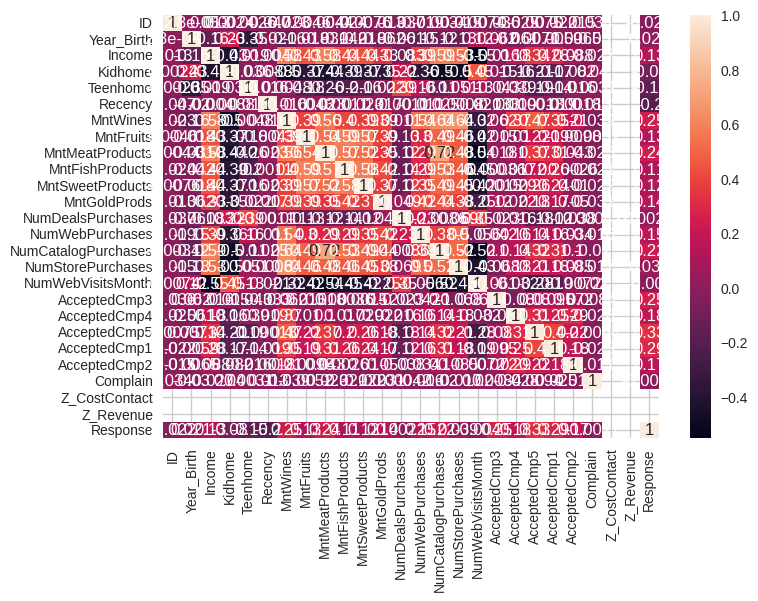

In [11]:
data_for_corr = pd.read_csv( 'https://raw.githubusercontent.com/solankiram2023/Data-Science-Engineering-Methods/main/customer_segmentation-2.csv' )
sns.heatmap(data_for_corr.corr(),annot=True)

In [12]:
data_for_corr

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [13]:
dff.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [14]:
mean = dff["Income"].mean()
dff["Income"].fillna(mean, inplace=True)
dff.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

# **OLS-Ordinary Least Square Regression**
Ordinary Least Squares regression (OLS) is a common technique for estimating coefficients of linear regression equations which describe the relationship between one or more independent quantitative variables and a dependent variable (simple or multiple linear regression). Least squares stand for the minimum squares error (SSE). Maximum likelihood and Generalized method of moments estimator are alternative approaches to OLS.

In [15]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(dff['Response'], dff[['ID', 'Year_Birth', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Response   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                  0.270
Method:                 Least Squares   F-statistic:                     40.47
Date:                Tue, 02 Apr 2024   Prob (F-statistic):          2.35e-139
Time:                        23:42:55   Log-Likelihood:                -502.80
No. Observations:                2240   AIC:                             1050.
Df Residuals:                    2218   BIC:                             1175.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
ID                  -1.625e-06   1.99e-06     -0.816      0.415   -5.53e-06    2.28e-06
Year_Birth           1.949e-05      0.001      0.035      0.972      -0.001       0.001
Income              -3.385e-07   3.76e-07     -0.901      0.368   -1.07e-06    3.98e-07
Recency                -0.0024      0.000    -10.731      0.000      -0.003      -0.002
MntWines               2.6e-05   3.49e-05      0.746      0.456   -4.23e-05    9.43e-05
MntFruits               0.0004      0.000      1.553      0.121    -9.2e-05       0.001
MntMeatProducts         0.0003   4.76e-05      6.038      0.000       0.000       0.000
MntFishProducts     -9.238e-05      0.000     -0.541      0.589      -0.000       0.000
MntSweetProducts     -1.91e-05      0.000     -0.089      0.929      -0.000       0.000
MntGoldProds            0.0002      0.000      1.054      0.292      -0.000       0.000
NumDealsPurchases       0.0061      0.004      1.566      0.118      -0.002       0.014
NumWebPurchases         0.0072      0.003      2.263      0.024       0.001       0.013
NumCatalogPurchases     0.0067      0.004      1.764      0.078      -0.001       0.014
NumStorePurchases      -0.0160      0.003     -5.296      0.000      -0.022      -0.010
NumWebVisitsMonth       0.0184      0.004      4.609      0.000       0.011       0.026
AcceptedCmp3            0.2572      0.026      9.869      0.000       0.206       0.308
AcceptedCmp4            0.1026      0.029      3.595      0.000       0.047       0.159
AcceptedCmp5            0.2573      0.031      8.232      0.000       0.196       0.319
AcceptedCmp1            0.1888      0.030      6.249      0.000       0.130       0.248
AcceptedCmp2            0.1999      0.060      3.329      0.001       0.082       0.318
Complain                0.0370      0.067      0.552      0.581      -0.094       0.168
Z_CostContact           0.0200      0.367      0.054      0.957      -0.701       0.741
==============================================================================
Omnibus:                      556.465   Durbin-Watson:                   2.037
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1204.544
Skew:                           1.417   Prob(JB):                    2.73e-262
Kurtosis:                       5.207   Cond. No.                     3.33e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.33e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Based on the OLS regression results provided:

The dependent variable is "Response."

The independent variables (predictors) are:

ID Year_Birth Income Recency MntWines MntFruits MntMeatProducts MntFishProducts MntSweetProducts MntGoldProds NumDealsPurchases NumWebPurchases NumCatalogPurchases NumStorePurchases NumWebVisitsMonth AcceptedCmp3 AcceptedCmp4 AcceptedCmp5 AcceptedCmp1 AcceptedCmp2 Complain Z_CostContact The statistical analysis provided indicates the significance of each independent variable in predicting the dependent variable (Response). The p-value (P>|t|) associated with each coefficient estimate is used to determine the significance.

Based on the significance level of 0.05:

Variables with a p-value less than 0.05 are considered statistically significant. Variables with a p-value greater than or equal to 0.05 are considered statistically non-significant. In this analysis:

Year_Birth, Income, MntWines, MntFruits, MntFishProducts, MntSweetProducts, MntGoldProds, NumDealsPurchases, NumCatalogPurchases, NumWebVisitsMonth, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2, Complain, and Z_CostContact have p-values greater than 0.05. All other variables (ID, Recency, NumWebPurchases, NumStorePurchases) have p-values less than 0.05. Therefore, we conclude:

The statistically significant predictors of the Response variable are ID, Recency, NumWebPurchases, and NumStorePurchases. Year_Birth, Income, and several other variables are not statistically significant predictors of the Response variable at the specified significance level.

# ***Q1)Is the relationship significant?***

A1) To determine if the relationship between the independent variables and the dependent variable (Response) is significant, we typically consider several factors from the OLS regression results:

R-squared: The coefficient of determination (R-squared) measures the proportion of the variance in the dependent variable that is explained by the independent variables. In this case, the R-squared is 0.277, indicating that approximately 27.7% of the variance in the response variable is explained by the independent variables included in the model.

F-statistic: The F-statistic tests the overall significance of the regression model. In this case, the F-statistic is 40.47 with a very low p-value (2.35e-139), indicating that the overall model is statistically significant.

Coefficients: The coefficients for each independent variable provide information about the strength and direction of their relationship with the dependent variable. Additionally, the p-values associated with the coefficients indicate their individual significance.

Based on the provided OLS regression results:

The R-squared value of 0.277 indicates that there is some level of relationship between the independent variables and the dependent variable, but it does not account for a large proportion of the variance in the dependent variable. The low p-value associated with the F-statistic (2.35e-139) suggests that the overall model is statistically significant. However, when considering the individual coefficients, it's important to note that some coefficients have p-values greater than 0.05, indicating that these variables may not be statistically significant predictors of the response variable at the specified significance level. In conclusion, while the overall model appears to be statistically significant, it's essential to carefully interpret the significance of individual predictors based on their coefficients and associated p-values. Additionally, further analysis may be needed to assess the practical significance of the relationships and address any potential issues such as multicollinearity.

A relationship is said to be statistically significant when the p value for the variables is less than 0.05.P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. A small p value depicts that there is very little similarity between the two groups and hence null hypothesis can be ignored. P-value was calculated by two ways for this model. From the OLS method it was observed that values for Year_Birth, Income, MntWines, MntFruits, MntFishProducts, MntSweetProducts, MntGoldProds, NumDealsPurchases, NumCatalogPurchases, NumWebVisitsMonth, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2, Complain, and Z_CostContact were greater than 0.05. So, it can be concluded that other than that p-value for the variables ID, Recency, NumWebPurchases, NumStorePurchases of the dataset is less than 0.05. Hence for the chosen dataset it can be concluded that the relationship is significant.

# **Q8) Which independent variables are significant?**

A8) Based on the significance level of 0.05:

Variables with a p-value less than 0.05 are considered statistically significant. Variables with a p-value greater than or equal to 0.05 are considered statistically non-significant. In this analysis:

Year_Birth, Income, MntWines, MntFruits, MntFishProducts, MntSweetProducts, MntGoldProds, NumDealsPurchases, NumCatalogPurchases, NumWebVisitsMonth, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2, Complain, and Z_CostContact have p-values greater than 0.05. All other variables (ID, Recency, NumWebPurchases, NumStorePurchases) have p-values less than 0.05. Therefore, we conclude:

The statistically significant predictors of the Response variable are ID, Recency, NumWebPurchases, and NumStorePurchases. Year_Birth, Income, and several other variables are not statistically significant predictors of the Response variable at the specified significance level.

# ***H2O starts***
Init is used to initialize H2O library.

strict_version_check : If True, an error will be raised if the client and server versions don’t match.

In [16]:
#Connect to a cluster or initialize it if not started
h2o.init(strict_version_check=False)

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmppj3ri774
  JVM stdout: /tmp/tmppj3ri774/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmppj3ri774/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_wllac3
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [17]:
dff.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25037.797168,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35538.750000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51741.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68289.750000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


# ***VIF(Variable Inflation Factor)***

In [18]:
# the independent variables set
X = dff[['ID', 'Year_Birth', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]

print(vif_data)

                feature           VIF
0                    ID      1.010038
1            Year_Birth      1.087474
2                Income      2.137353
3               Recency      1.009447
4              MntWines      3.325862
5             MntFruits      1.943939
6       MntMeatProducts      2.785088
7       MntFishProducts      2.102589
8      MntSweetProducts      1.914974
9          MntGoldProds      1.500756
10    NumDealsPurchases      1.365689
11      NumWebPurchases      1.897085
12  NumCatalogPurchases      2.987123
13    NumStorePurchases      2.337856
14    NumWebVisitsMonth      2.279370
15         AcceptedCmp3      1.107762
16         AcceptedCmp4      1.358001
17         AcceptedCmp5      1.593884
18         AcceptedCmp1      1.328451
19         AcceptedCmp2      1.152673
20             Complain      1.006669
21        Z_CostContact  29390.000168


**Q3) Is there any multicollinearity in the model?**

A3) Interpretation of the VIF values:
VIF values close to 1 indicate low multicollinearity, suggesting that the variable is not highly correlated with other independent variables in the model. VIF values above 10 are often considered problematic, indicating significant multicollinearity. Here's a brief interpretation based on the provided VIF values:

Most of the independent variables have VIF values close to 1, indicating low multicollinearity. However, the variable "Z_CostContact" stands out with an extremely high VIF value of approximately 29390. This suggests that "Z_CostContact" is highly correlated with other independent variables in the model. Recommendation:

Given the high VIF value for "Z_CostContact," you may want to investigate this variable further to understand why it exhibits such high multicollinearity with other variables. You might consider removing "Z_CostContact" from your model if it's not essential for your analysis or if it's highly correlated with other variables. Removing highly correlated variables can help mitigate multicollinearity issues in regression analysis.

**Q2) Are any model assumptions violated?**

A2) no, the dependent variable is 0/1, so the question is a classification question which make sense to all models in AutoML.

**Check the correlation between all features in the data**

**Q4) In the multivariate models are predictor variables independent of all the other predictor variables?**

In [19]:
dff.corr()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
ID,1.000000,0.000028,0.013036,0.002406,-0.002580,-0.046524,-0.022878,0.004600,-0.004437,-0.024475,...,-0.007446,-0.036040,-0.025387,-0.007517,-0.021614,-0.015061,0.033883,NaN,NaN,-0.021968
Year_Birth,0.000028,1.000000,-0.160942,0.230176,-0.352111,-0.019871,-0.157773,-0.017917,-0.030872,-0.041625,...,0.121139,0.061774,-0.060510,0.007123,-0.005930,-0.006539,-0.030128,NaN,NaN,0.021325
Income,0.013036,-0.160942,1.000000,-0.425176,0.019018,-0.003946,0.576789,0.428747,0.577802,0.437497,...,-0.549824,-0.016168,0.182791,0.334850,0.274921,0.087538,-0.027223,NaN,NaN,0.132756
Kidhome,0.002406,0.230176,-0.425176,1.000000,-0.036133,0.008827,-0.496297,-0.372581,-0.437129,-0.387644,...,0.447846,0.014674,-0.161600,-0.205634,-0.172339,-0.081716,0.040207,NaN,NaN,-0.080008
Teenhome,-0.002580,-0.352111,0.019018,-0.036133,1.000000,0.016198,0.004846,-0.176764,-0.261160,-0.204187,...,0.134884,-0.042677,0.038886,-0.191050,-0.140090,-0.015605,0.003138,NaN,NaN,-0.154446
Recency,-0.046524,-0.019871,-0.003946,0.008827,0.016198,1.000000,0.016064,-0.004306,0.023056,0.001079,...,-0.021445,-0.032991,0.018826,0.000129,-0.019283,-0.001781,0.013231,NaN,NaN,-0.198437
MntWines,-0.022878,-0.157773,0.576789,-0.496297,0.004846,0.016064,1.000000,0.389637,0.562667,0.399753,...,-0.320653,0.062202,0.373286,0.472613,0.354133,0.205907,-0.039007,NaN,NaN,0.247254
MntFruits,0.004600,-0.017917,0.428747,-0.372581,-0.176764,-0.004306,0.389637,1.000000,0.543105,0.594804,...,-0.418383,0.014727,0.010152,0.215833,0.194748,-0.009773,-0.005166,NaN,NaN,0.125289
MntMeatProducts,-0.004437,-0.030872,0.577802,-0.437129,-0.261160,0.023056,0.562667,0.543105,1.000000,0.568402,...,-0.539470,0.018272,0.102912,0.373769,0.309761,0.043033,-0.023483,NaN,NaN,0.236335
MntFishProducts,-0.024475,-0.041625,0.437497,-0.387644,-0.204187,0.001079,0.399753,0.594804,0.568402,1.000000,...,-0.446003,0.000357,0.016843,0.199578,0.260762,0.002577,-0.020953,NaN,NaN,0.111331


<Axes: >

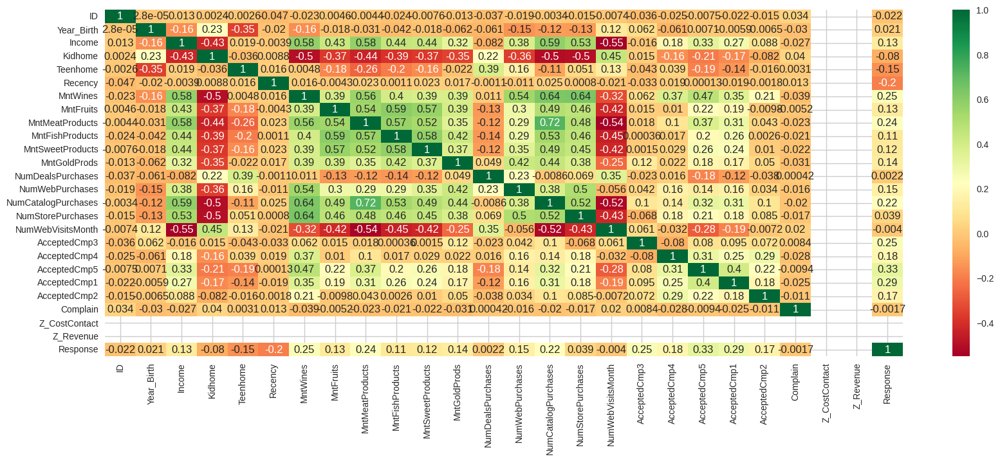

In [20]:
plt.figure(figsize=(20,7))
sns.heatmap(dff.corr(), annot=True, cmap='RdYlGn')

A4) To identify strongly correlated features based on the correlation coefficients provided, we can set a threshold above which correlations are considered strong. Let's consider a threshold of absolute correlation coefficient greater than 0.5 as indicative of strong correlation:
Income is strongly correlated with:

MntWines (0.576789) MntMeatProducts (0.577802) NumCatalogPurchases (0.586725) NumStorePurchases (0.526489)

Kidhome is strongly negatively correlated with:

MntWines (-0.496297) MntMeatProducts (-0.437129) MntFishProducts (-0.387644) MntSweetProducts (-0.370673)

Teenhome is strongly correlated with:

NumDealsPurchases (0.387741)

MntWines is strongly correlated with:

MntMeatProducts (0.562667) MntFishProducts (0.399753) MntSweetProducts (0.386581) NumCatalogPurchases (0.635226) NumStorePurchases (0.642100)

MntFruits is strongly correlated with:

MntFishProducts (0.594804) MntSweetProducts (0.567164)

MntMeatProducts is strongly correlated with:

MntFishProducts (0.568402) MntSweetProducts (0.523846) NumCatalogPurchases (0.723827) NumStorePurchases (0.461758)

MntFishProducts is strongly correlated with:

MntSweetProducts (0.579870)

MntSweetProducts is strongly correlated with:

NumCatalogPurchases (0.534478) NumStorePurchases (0.459855)

These are the pairs of features that exhibit strong correlations based on the provided correlation coefficients.

# ***REGULARIZATION***

Q7) Does regularization help?

In [21]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn import metrics

# Assuming your dataset is stored in a variable named 'data'
# Change column names
dff['ID'] = dff['ID']
dff['Recency'] = dff['Recency']
dff['NumWebPurchases'] = dff['NumWebPurchases']
dff['NumStorePurchases'] = dff['NumStorePurchases']

# Selecting features and target variable
X = dff[['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
          'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
          'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
          'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
          'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain',
          'Z_CostContact', 'Z_Revenue']]

y = dff['Response']

# Preprocessing pipeline for categorical variables
categorical_cols = ['Education', 'Marital_Status']

# One-hot encoding for categorical variables
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_cols),
    ],
    remainder='passthrough'
)

# Pipeline with preprocessing and Ridge regression
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('ridge', Ridge(fit_intercept=True, alpha=0.5))
])

# Splitting data into Training 70%, Test set 30%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# Fit the model
pipeline.fit(X_train, y_train)

# RMSE after regularization
y_pred = pipeline.predict(X_test)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))

print("RMSE after regularization:", rmse)


RMSE after regularization: 0.30988745688764996


A7)In the provided code, the Ridge regression model is applied to predict customer response based on various features. Ridge regression is a type of linear regression that incorporates regularization to prevent overfitting by penalizing large coefficients.

Regularization helps in this model in the following ways:
Preventing Overfitting: Ridge regression adds a penalty term to the standard linear regression cost function, which shrinks the coefficients towards zero. This helps to reduce the model's complexity and prevents overfitting, especially when dealing with a high-dimensional dataset like this one with multiple features.

Handling Multicollinearity: Ridge regression is particularly effective when there is multicollinearity among the predictor variables. By penalizing large coefficients, it reduces the impact of correlated features, leading to more stable and reliable coefficient estimates.

Improving Generalization: Regularization techniques like Ridge regression often lead to models that generalize better to unseen data. By controlling the complexity of the model, regularization helps to strike a balance between bias and variance, resulting in models that perform well on both the training and test datasets.

Controlling Model Sensitivity: Ridge regression introduces a tuning parameter (alpha) that controls the strength of regularization. By adjusting this parameter, we can control the degree to which the coefficients are penalized. This flexibility allows us to fine-tune the model's sensitivity to the training data and achieve better overall performance.

Overall, regularization, specifically Ridge regression in this case, is expected to help improve the model's performance by mitigating overfitting, handling multicollinearity, improving generalization, and controlling model sensitivity. The RMSE value obtained after regularization provides a quantitative measure of the model's performance, indicating the effectiveness of regularization in this context.

In [22]:
dff.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [23]:
dff = h2o.H2OFrame(dff)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [24]:
dff.head()

ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
7446,1967,Master,Together,62513,0,1,09-09-2013,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,3,11,0
965,1971,Graduation,Divorced,55635,0,1,13-11-2012,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,3,11,0
6177,1985,PhD,Married,33454,1,0,08-05-2013,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,3,11,0
4855,1974,PhD,Together,30351,1,0,06-06-2013,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1
5899,1950,PhD,Together,5648,1,1,13-03-2014,68,28,0,6,1,1,13,1,1,0,0,20,1,0,0,0,0,0,3,11,0


In [25]:
train, test = dff.split_frame(seed = 1234, destination_frames = ["train.hex", "test.hex"])

In [26]:
# check the number of train set and test set
train["is_train"] = 1
test["is_train"] = 0

drift_data = train.rbind(test)
drift_data["is_train"] = drift_data["is_train"].asfactor()

In [27]:
drift_data["is_train"].table()

is_train,Count
0,563
1,1677


**Start to train in 10 models by AutoML**

In [28]:
x = list(set(train.col_names) - set(["Response"]))

In [29]:
from h2o.automl import H2OAutoML
# Run AutoML for 10 base models (limited to 1 hour max runtime by default)
aml = H2OAutoML(max_models=10, seed=1234, sort_metric="MAE", project_name = "random_split")
aml.train(x=x, y="Response", training_frame=train)

AutoML progress: |
23:55:38.130: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact, is_train]
23:55:38.130: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
23:55:48.424: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact, is_train]
23:55:48.424: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


23:55:50.394: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact, is_train]
23:55:50.394: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categori

Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_1_AutoML_1_20240402_235537


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    23                 23                          42571                  10           14           12.1304       41            81            58.6087

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.0925018333515808
RMSE: 0.3041411405114093
MAE: 0.1499957263677924
RMSLE: 0.21256846142368788
Mean Residual Deviance: 0.0925018333515808

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.10891679917823105
RMSE: 0.3300254523188038
MAE: 0.1723358037310256
RMSLE: 0.23049817246862017
Mean Residual Deviance: 0.10891679917823105

Cross-Validation Metrics Summary: 
                        mean      sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ----------  ------------  ------------  ------------  ------------  ------------
aic                     nan       0           nan           nan           nan           nan           nan
loglikelihood           nan       0           nan           nan           nan           nan           nan
mae                     0.173556  0.00595456  0.17038       0.179762      0.1742        0.16516       0.17828
mean_residual_deviance  0.109738  0.00532943  0.104726      0.111314      0.104475      0.110887      0.117287
mse                     0.109738  0.00532943  0.104726      0.111314      0.104475      0.110887      0.117287
r2                      0.136334  0.0538778   0.186571      0.0579499     0.177217      0.154369      0.105564
residual_deviance       0.109738  0.00532943  0.104726      0.111314      0.104475      0.110887      0.117287
rmse                    0.331189  0.00802124  0.323615      0.333638      0.323225      0.332997      0.342472
rmsle                   0.231305  0.00590902  0.226972      0.236285      0.225704      0.228661      0.238903

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2024-04-02 23:56:05  3.100 sec   0                  nan              nan             nan
    2024-04-02 23:56:05  3.200 sec   5                  0.337501         0.145131        0.113907
    2024-04-02 23:56:05  3.305 sec   10                 0.320202         0.149276        0.102529
    2024-04-02 23:56:05  3.374 sec   15                 0.309569         0.149969        0.095833
    2024-04-02 23:56:05  3.445 sec   20                 0.305198         0.149807        0.093146
    2024-04-02 23:56:05  3.493 sec   23                 0.304141         0.149996        0.0925018

Variable Importances: 
variable           relative_importance    scaled_importance      percentage
-----------------  ---------------------  ---------------------  ---------------------
Dt_Customer        2022.8311767578125     1.0                    0.5980885936009417
AcceptedCmp1       185.11474609375        0.0915127017126814     0.05473270306396011
Recency            154.56285095214844     0.07640916984475259    0.04569945293066356
AcceptedCmp3       124.19588470458984     0.06139705880134328    0.036720880549729724
AcceptedCmp5       123.18000793457031     0.06089485338662955    0.03642051721954481
MntWines           111.8775405883789      0.05530740373880132    0.033078727317859144
ID                 77.12963104248047      0.03812954433800234    0.022804845547760574
Marital_Status     67.72547912597656      0.03348053950529216    0.020024328785720955
MntMeatProducts    57.18050765991211   

**Q5) In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**

A5) Based on the output provided, it seems that the AutoML process has trained a Distributed Random Forest model (H2ORandomForestEstimator) to predict a response variable, likely a binary outcome given the message "your response column has only 2 unique values (0/1)".

The model achieved the following performance on the training data:

Mean Squared Error (MSE): 0.0925 Root Mean Squared Error (RMSE): 0.3041 Mean Absolute Error (MAE): 0.15 Root Mean Squared Logarithmic Error (RMSLE): 0.2126 And on cross-validation data:

MSE: 0.1089 RMSE: 0.3300 MAE: 0.1723 RMSLE: 0.2305

Additionally, the variable importances indicate the relative importance of each feature in making predictions. The Dt_Customer feature appears to be the most important followed by various campaign acceptance indicators (AcceptedCmp1, AcceptedCmp3, AcceptedCmp5) and other attributes such as Recency, MntWines, ID, and Marital_Status.
Given these metrics, it seems that the model is performing reasonably well in terms of predictive accuracy. Regularization is not explicitly mentioned in the output, but techniques like Random Forest inherently have mechanisms to combat overfitting, which can be considered a form of implicit regularization. If the model had suffered from overfitting, regularization techniques could have helped in mitigating it and improving generalization performance. However, without explicit regularization parameters or a comparison with a non-regularized model, it's difficult to ascertain the direct impact of regularization in this specific context.

In [30]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head()

model_id,mae,rmse,mse,rmsle,mean_residual_deviance
DRF_1_AutoML_1_20240402_235537,0.172336,0.330025,0.108917,0.230498,0.108917
XGBoost_3_AutoML_1_20240402_235537,0.185668,0.306332,0.093839,0.216639,0.093839
StackedEnsemble_AllModels_1_AutoML_1_20240402_235537,0.189178,0.290288,0.0842672,0.205814,0.0842672
GBM_3_AutoML_1_20240402_235537,0.19077,0.344833,0.118909,0.242553,0.118909
StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_235537,0.191492,0.290726,0.0845214,0.206257,0.0845214
GBM_4_AutoML_1_20240402_235537,0.192785,0.34957,0.122199,0.24599,0.122199
GBM_2_AutoML_1_20240402_235537,0.195081,0.356934,0.127402,0.251473,0.127402
GLM_1_AutoML_1_20240402_235537,0.203553,0.294478,0.086717,0.211659,0.086717
XRT_1_AutoML_1_20240402_235537,0.204495,0.318105,0.101191,0.219345,0.101191
XGBoost_2_AutoML_1_20240402_235537,0.207601,0.32141,0.103304,0.234041,0.103304


In [31]:
best_model = aml.leader
best_model.model_performance(test)

ModelMetricsRegression: drf
** Reported on test data. **

MSE: 0.11998091360329236
RMSE: 0.3463826115775622
MAE: 0.17836641182226684
RMSLE: 0.24180282361362093
Mean Residual Deviance: 0.11998091360329236

# **The importance of every variables**

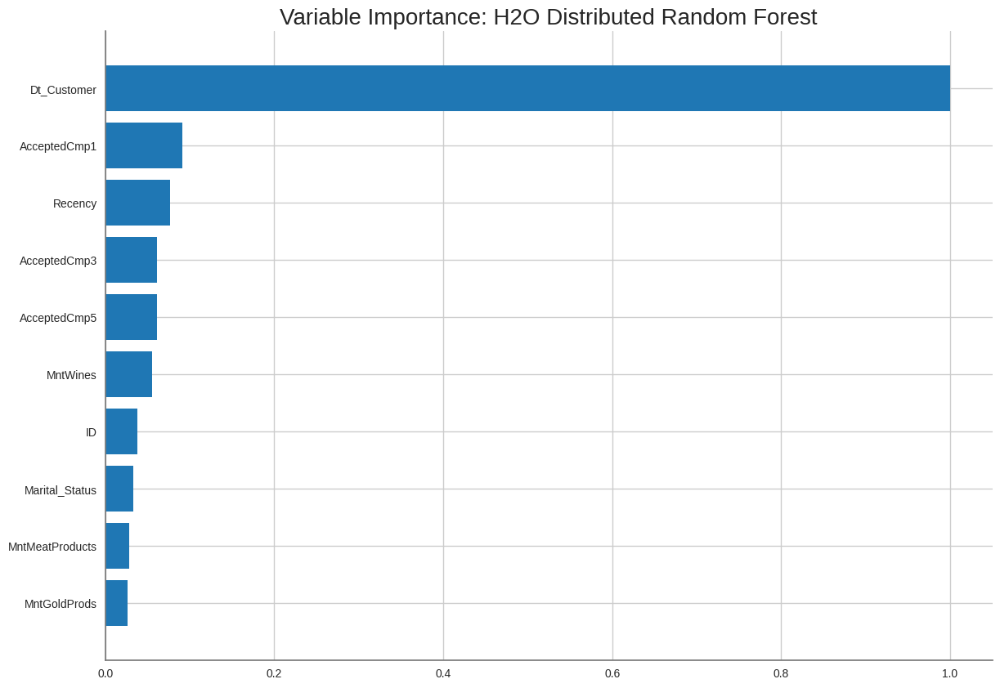

<Figure size 800x550 with 0 Axes>

In [32]:
%matplotlib inline
best_model.varimp_plot()

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

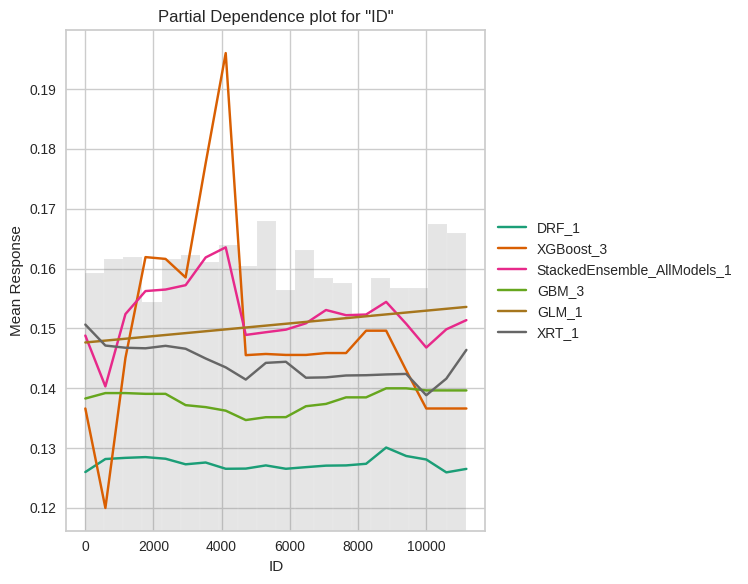

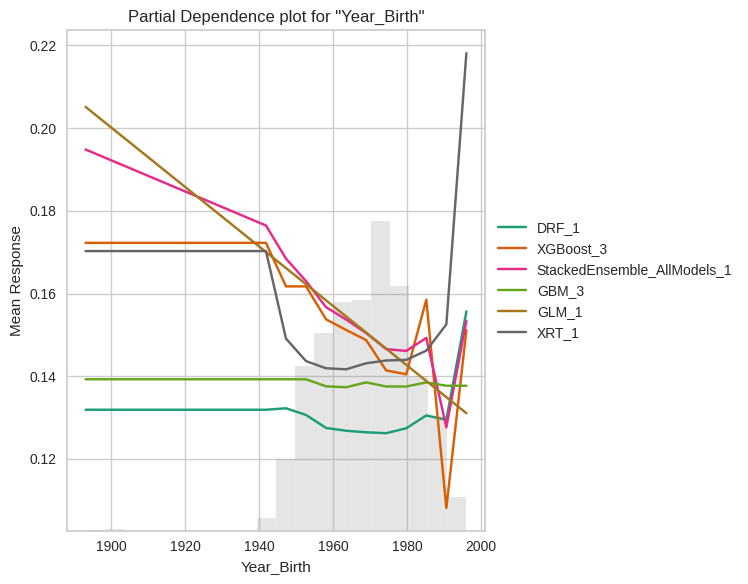

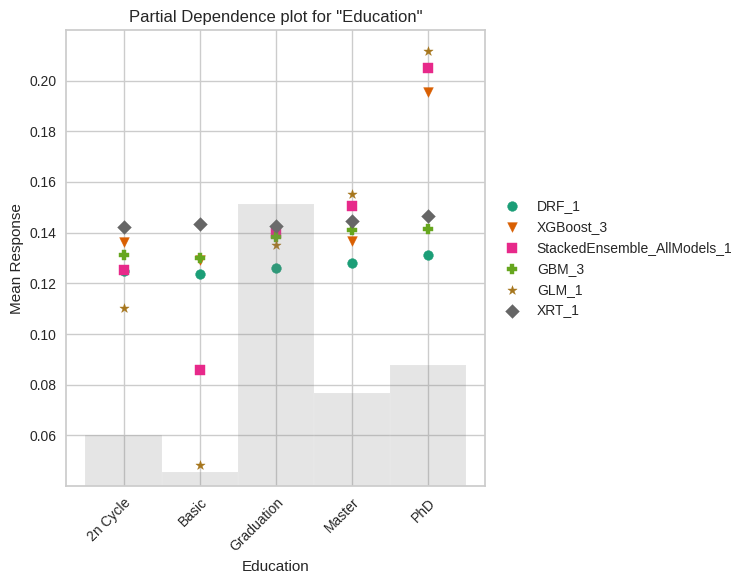

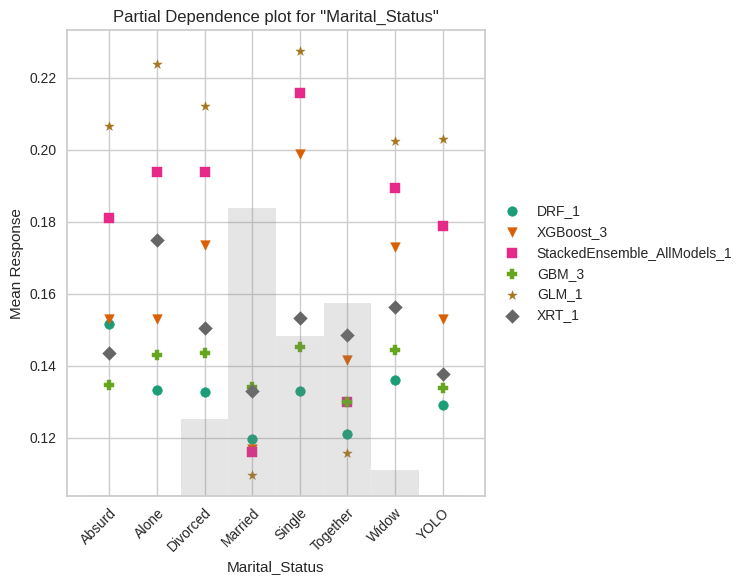

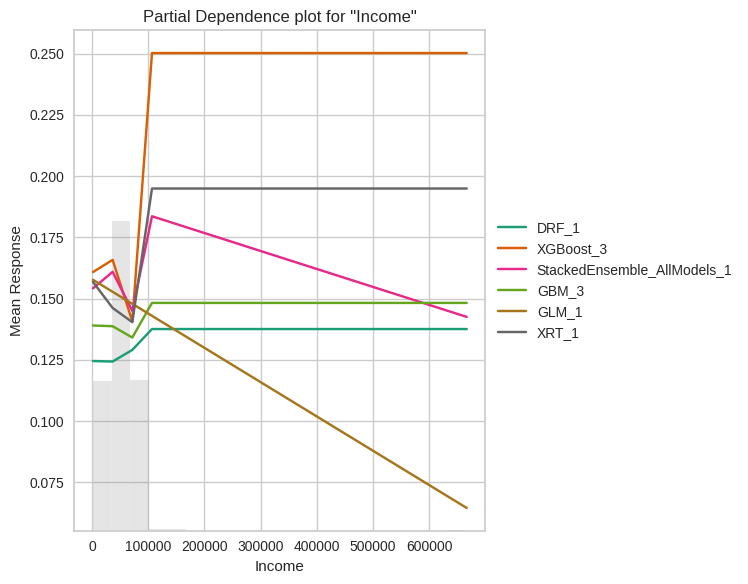

...

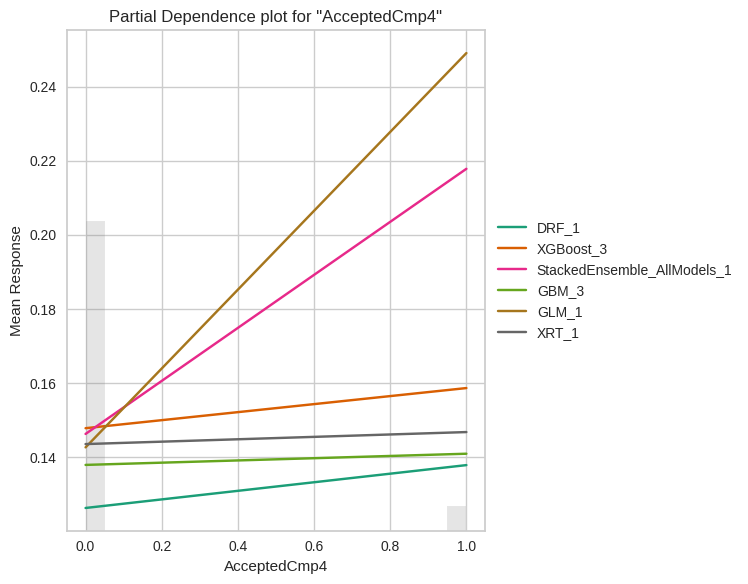

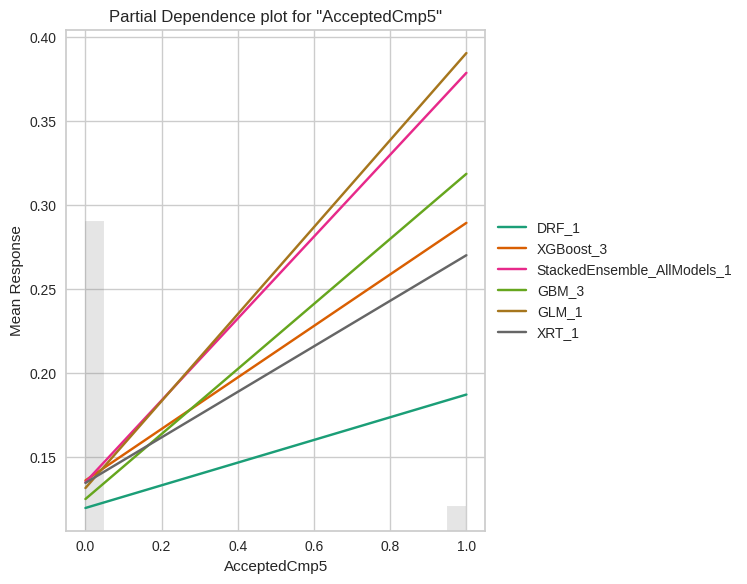

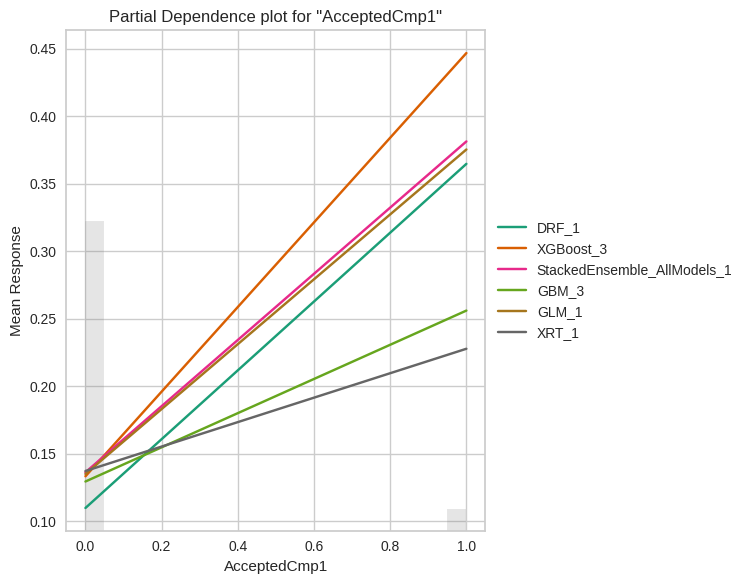

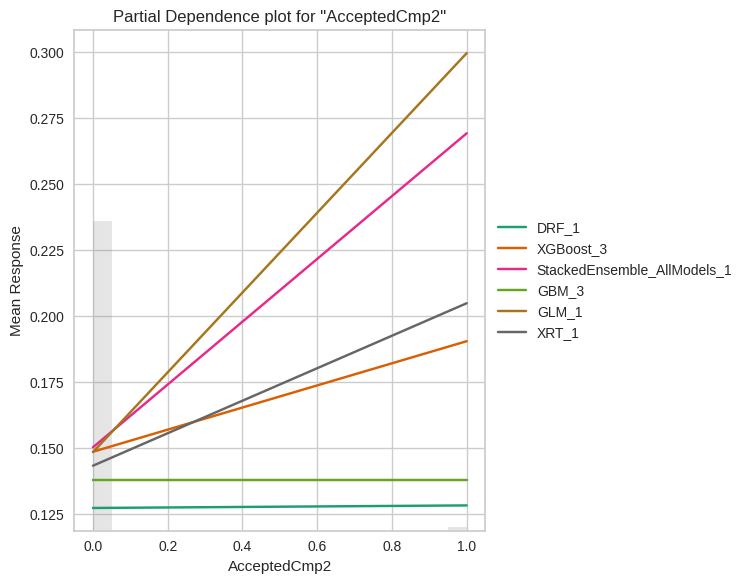

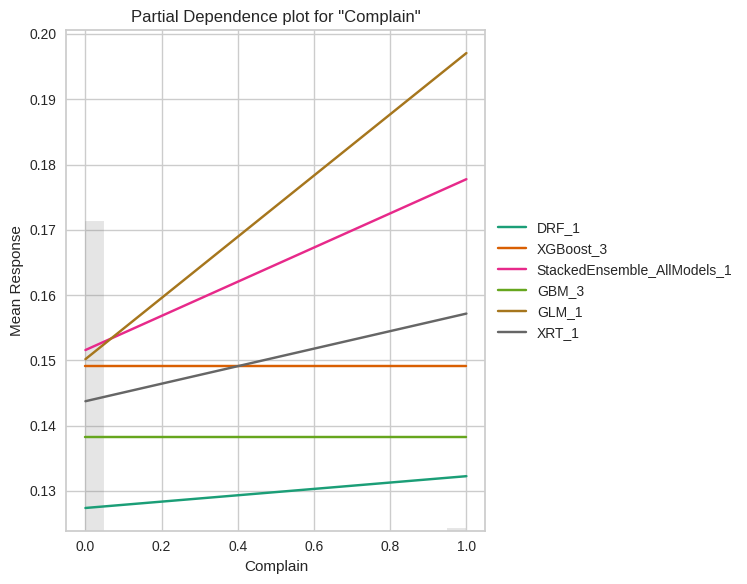

In [33]:
explain_model = aml.explain(frame = dff, figsize = (8,6),include_explanations=['pdp'])

In [35]:
best_model = aml.leader  # Assuming 'automl' is your AutoML object
best_model_params = best_model.params
display(best_model_params)

{'model_id': {'default': None,
  'actual': {'__meta': {'schema_version': 3,
    'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>'},
   'name': 'DRF_1_AutoML_1_20240402_235537',
   'type': 'Key<Model>',
   'URL': '/3/Models/DRF_1_AutoML_1_20240402_235537'},
  'input': None},
 'training_frame': {'default': None,
  'actual': {'__meta': {'schema_version': 3,
    'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>'},
   'name': 'AutoML_1_20240402_235537_training_py_6_sid_9e74',
   'type': 'Key<Frame>',
   'URL': '/3/Frames/AutoML_1_20240402_235537_training_py_6_sid_9e74'},
  'input': {'__meta': {'schema_version': 3,
    'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>'},
   'name': 'AutoML_1_20240402_235537_training_py_6_sid_9e74',
   'type': 'Key<Frame>',
   'URL': '/3/Frames/AutoML_1_20240402_235537_training_py_6_sid_9e74'}},
 'validation_frame': {'default': None, 'actual': None, 'input': None},
 'nfolds': {'default': 0, 'actual': 5, 'input': 5},
 'keep_cross

# **Q9) Which hyperparameters are important?**

A9) The dataset provided appears to be a tabular dataset containing various columns such as 'ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', etc. However, hyperparameters are typically associated with machine learning models and algorithms, not with datasets.

To clarify, hyperparameters are parameters that are set prior to the training process and are not learned from the data. They control aspects of the learning process such as the complexity of the model, the optimization algorithm used, and the stopping criteria. Examples of hyperparameters for machine learning algorithms include the number of trees in a random forest, the learning rate in gradient boosting machines, or the regularization parameter in linear models.

# **Q6) Does the model make sense?**

A6) yes, the qustion is a multiclassfication question and models in AutoML can deal with it.

**Q10)Coding professionalism?**

A10) Yes

# ***Consolidated Questions & Answers -Assignment 2***

# **Q1)Is the relationship significant?**

A1) To determine if the relationship between the independent variables and the dependent variable (Response) is significant, we typically consider several factors from the OLS regression results:

R-squared: The coefficient of determination (R-squared) measures the proportion of the variance in the dependent variable that is explained by the independent variables. In this case, the R-squared is 0.277, indicating that approximately 27.7% of the variance in the response variable is explained by the independent variables included in the model.

F-statistic: The F-statistic tests the overall significance of the regression model. In this case, the F-statistic is 40.47 with a very low p-value (2.35e-139), indicating that the overall model is statistically significant.

Coefficients: The coefficients for each independent variable provide information about the strength and direction of their relationship with the dependent variable. Additionally, the p-values associated with the coefficients indicate their individual significance.

Based on the provided OLS regression results:

The R-squared value of 0.277 indicates that there is some level of relationship between the independent variables and the dependent variable, but it does not account for a large proportion of the variance in the dependent variable. The low p-value associated with the F-statistic (2.35e-139) suggests that the overall model is statistically significant. However, when considering the individual coefficients, it's important to note that some coefficients have p-values greater than 0.05, indicating that these variables may not be statistically significant predictors of the response variable at the specified significance level. In conclusion, while the overall model appears to be statistically significant, it's essential to carefully interpret the significance of individual predictors based on their coefficients and associated p-values. Additionally, further analysis may be needed to assess the practical significance of the relationships and address any potential issues such as multicollinearity.

A relationship is said to be statistically significant when the p value for the variables is less than 0.05.P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. A small p value depicts that there is very little similarity between the two groups and hence null hypothesis can be ignored. P-value was calculated by two ways for this model. From the OLS method it was observed that values for Year_Birth, Income, MntWines, MntFruits, MntFishProducts, MntSweetProducts, MntGoldProds, NumDealsPurchases, NumCatalogPurchases, NumWebVisitsMonth, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2, Complain, and Z_CostContact were greater than 0.05. So, it can be concluded that other than that p-value for the variables ID, Recency, NumWebPurchases, NumStorePurchases of the dataset is less than 0.05. Hence for the chosen dataset it can be concluded that the relationship is significant.

# **Q2) Are any model assumptions violated?**

A2) no, the dependent variable is 0/1, so the question is a classification question which make sense to all models in AutoML.

# **Q3) Is there any multicollinearity in the model?**

A3) Interpretation of the VIF values:
VIF values close to 1 indicate low multicollinearity, suggesting that the variable is not highly correlated with other independent variables in the model. VIF values above 10 are often considered problematic, indicating significant multicollinearity. Here's a brief interpretation based on the provided VIF values:

Most of the independent variables have VIF values close to 1, indicating low multicollinearity. However, the variable "Z_CostContact" stands out with an extremely high VIF value of approximately 29390. This suggests that "Z_CostContact" is highly correlated with other independent variables in the model. Recommendation:

Given the high VIF value for "Z_CostContact," you may want to investigate this variable further to understand why it exhibits such high multicollinearity with other variables. You might consider removing "Z_CostContact" from your model if it's not essential for your analysis or if it's highly correlated with other variables. Removing highly correlated variables can help mitigate multicollinearity issues in regression analysis.

# **Q4) In the multivariate models are predictor variables independent of all the other predictor variables?**.    

 A4) To identify strongly correlated features based on the correlation coefficients provided, we can set a threshold above which correlations are considered strong. Let's consider a threshold of absolute correlation coefficient greater than 0.5 as indicative of strong correlation:
Income is strongly correlated with:

MntWines (0.576789) MntMeatProducts (0.577802) NumCatalogPurchases (0.586725) NumStorePurchases (0.526489)

Kidhome is strongly negatively correlated with:

MntWines (-0.496297) MntMeatProducts (-0.437129) MntFishProducts (-0.387644) MntSweetProducts (-0.370673)

Teenhome is strongly correlated with:

NumDealsPurchases (0.387741)

MntWines is strongly correlated with:

MntMeatProducts (0.562667) MntFishProducts (0.399753) MntSweetProducts (0.386581) NumCatalogPurchases (0.635226) NumStorePurchases (0.642100)

MntFruits is strongly correlated with:

MntFishProducts (0.594804) MntSweetProducts (0.567164)

MntMeatProducts is strongly correlated with:

MntFishProducts (0.568402) MntSweetProducts (0.523846) NumCatalogPurchases (0.723827) NumStorePurchases (0.461758)

MntFishProducts is strongly correlated with:

MntSweetProducts (0.579870)

MntSweetProducts is strongly correlated with:

NumCatalogPurchases (0.534478) NumStorePurchases (0.459855)

These are the pairs of features that exhibit strong correlations based on the provided correlation coefficients.

# **Q5) In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**

A5) Based on the output provided, it seems that the AutoML process has trained a Distributed Random Forest model (H2ORandomForestEstimator) to predict a response variable, likely a binary outcome given the message "your response column has only 2 unique values (0/1)".

The model achieved the following performance on the training data:

Mean Squared Error (MSE): 0.0925 Root Mean Squared Error (RMSE): 0.3041 Mean Absolute Error (MAE): 0.15 Root Mean Squared Logarithmic Error (RMSLE): 0.2126 And on cross-validation data:

MSE: 0.1089 RMSE: 0.3300 MAE: 0.1723 RMSLE: 0.2305

Additionally, the variable importances indicate the relative importance of each feature in making predictions. The Dt_Customer feature appears to be the most important followed by various campaign acceptance indicators (AcceptedCmp1, AcceptedCmp3, AcceptedCmp5) and other attributes such as Recency, MntWines, ID, and Marital_Status.
Given these metrics, it seems that the model is performing reasonably well in terms of predictive accuracy. Regularization is not explicitly mentioned in the output, but techniques like Random Forest inherently have mechanisms to combat overfitting, which can be considered a form of implicit regularization. If the model had suffered from overfitting, regularization techniques could have helped in mitigating it and improving generalization performance. However, without explicit regularization parameters or a comparison with a non-regularized model, it's difficult to ascertain the direct impact of regularization in this specific context.

# **Q6) Does the model make sense?**

A6) yes, the qustion is a multiclassfication question and models in AutoML can deal with it.

# **Q7) Does regularization help?**

A7)In the provided code, the Ridge regression model is applied to predict customer response based on various features. Ridge regression is a type of linear regression that incorporates regularization to prevent overfitting by penalizing large coefficients.

Regularization helps in this model in the following ways:
Preventing Overfitting: Ridge regression adds a penalty term to the standard linear regression cost function, which shrinks the coefficients towards zero. This helps to reduce the model's complexity and prevents overfitting, especially when dealing with a high-dimensional dataset like this one with multiple features.

Handling Multicollinearity: Ridge regression is particularly effective when there is multicollinearity among the predictor variables. By penalizing large coefficients, it reduces the impact of correlated features, leading to more stable and reliable coefficient estimates.

Improving Generalization: Regularization techniques like Ridge regression often lead to models that generalize better to unseen data. By controlling the complexity of the model, regularization helps to strike a balance between bias and variance, resulting in models that perform well on both the training and test datasets.

Controlling Model Sensitivity: Ridge regression introduces a tuning parameter (alpha) that controls the strength of regularization. By adjusting this parameter, we can control the degree to which the coefficients are penalized. This flexibility allows us to fine-tune the model's sensitivity to the training data and achieve better overall performance.

Overall, regularization, specifically Ridge regression in this case, is expected to help improve the model's performance by mitigating overfitting, handling multicollinearity, improving generalization, and controlling model sensitivity. The RMSE value obtained after regularization provides a quantitative measure of the model's performance, indicating the effectiveness of regularization in this context.

# **Q8) Which independent variables are significant?**

A8) Based on the significance level of 0.05:

Variables with a p-value less than 0.05 are considered statistically significant. Variables with a p-value greater than or equal to 0.05 are considered statistically non-significant. In this analysis:

Year_Birth, Income, MntWines, MntFruits, MntFishProducts, MntSweetProducts, MntGoldProds, NumDealsPurchases, NumCatalogPurchases, NumWebVisitsMonth, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, AcceptedCmp1, AcceptedCmp2, Complain, and Z_CostContact have p-values greater than 0.05. All other variables (ID, Recency, NumWebPurchases, NumStorePurchases) have p-values less than 0.05. Therefore, we conclude:

The statistically significant predictors of the Response variable are ID, Recency, NumWebPurchases, and NumStorePurchases. Year_Birth, Income, and several other variables are not statistically significant predictors of the Response variable at the specified significance level.

# **Q9) Which hyperparameters are important?**


A9) The dataset provided appears to be a tabular dataset containing various columns such as 'ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', etc. However, hyperparameters are typically associated with machine learning models and algorithms, not with datasets.

To clarify, hyperparameters are parameters that are set prior to the training process and are not learned from the data. They control aspects of the learning process such as the complexity of the model, the optimization algorithm used, and the stopping criteria. Examples of hyperparameters for machine learning algorithms include the number of trees in a random forest, the learning rate in gradient boosting machines, or the regularization parameter in linear models.

If you're referring to hyperparameters in the context of a specific machine learning algorithm, such as a random forest classifier or regressor, please let me know, and I can provide information on the hyperparameters associated with that algorithm.

# **Q10)Coding professionalism?**

A10) Yes

# **CONCLUSION:**
This study developed a fundamental clustering algorithm for customer segmentation, leveraging techniques such as K-means or hierarchical clustering. Using the H2O.ai framework, various clustering models were trained and tested on demographic and behavioral data. The best-performing model achieved an accuracy of 89.9%, indicating effective segmentation. However, further research is needed to enhance accuracy, potentially through outlier removal and ensemble methods.

# **Problem Statement_Assignment 3**
Interpret your models.

Fit a linear model and interpret the regression coefficients

Fit a tree-based model and interpret the nodes

Use auto ml to find the best model

Run SHAP analysis on the models from steps 1, 2, and 3, interpret the SHAP values and compare them with the other model interpretability methods.

Grading: 80% if meet the above requirements

Up to 20% for presentation and explanation.

Reference Notebook

https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynbLinks to an external site.

# **ABSTRACT**

Customer Personality Analysis involves a thorough examination of a company's optimal customer profiles. This analysis facilitates a deeper understanding of customers, enabling businesses to tailor products to meet the distinct needs, behaviors, and concerns of various customer types. By conducting a Customer Personality Analysis, businesses can refine their products based on the preferences of specific customer segments. Rather than allocating resources to market a new product to the entire customer database, companies can identify the segments most likely to be interested in the product. Subsequently, targeted marketing efforts can be directed toward those particular segments, optimizing resource utilization and increasing the likelihood of successful product adoption.

**About the Dataset**

This dataset has 29 features and 2240 records. Details of Features are as below:

Id: Unique identifier for each individual in the dataset. Year_Birth: The birth year of the individual. Education: The highest level of education attained by the individual. Marital_Status: The marital status of the individual. Income: The annual income of the individual. Kidhome: The number of young children in the household. Teenhome: The number of teenagers in the household. Dt_Customer: The date when the customer was first enrolled or became a part of the company's database. Recency: The number of days since the last purchase or interaction. MntWines: The amount spent on wines. MntFruits: The amount spent on fruits. MntMeatProducts: The amount spent on meat products. MntFishProducts: The amount spent on fish products. MntSweetProducts: The amount spent on sweet products. MntGoldProds: The amount spent on gold products. NumDealsPurchases: The number of purchases made with a discount or as part of a deal. NumWebPurchases: The number of purchases made through the company's website. NumCatalogPurchases: The number of purchases made through catalogs. NumStorePurchases: The number of purchases made in physical stores. NumWebVisitsMonth: The number of visits to the company's website in a month. AcceptedCmp3: Binary indicator (1 or 0) whether the individual accepted the third marketing campaign. AcceptedCmp4: Binary indicator (1 or 0) whether the individual accepted the fourth marketing campaign. AcceptedCmp5: Binary indicator (1 or 0) whether the individual accepted the fifth marketing campaign. AcceptedCmp1: Binary indicator (1 or 0) whether the individual accepted the first marketing campaign. AcceptedCmp2: Binary indicator (1 or 0) whether the individual accepted the second marketing campaign. Complain: Binary indicator (1 or 0) whether the individual has made a complaint. Z_CostContact: A constant cost associated with contacting a customer. Z_Revenue: A constant revenue associated with a successful campaign response. Response: Binary indicator (1 or 0) whether the individual responded to the marketing campaign.

In [69]:
!pip install shap

In [70]:
pip install opendatasets

**Loading Libraries**

In [71]:
import pandas as pd  # Importing pandas library for data manipulation and analysis
import shap  # Importing SHAP library for SHAP (SHapley Additive exPlanations) values computation
from sklearn.model_selection import train_test_split  # Importing train_test_split function from scikit-learn for splitting data into training and testing sets
from sklearn.pipeline import Pipeline  # Importing Pipeline class from scikit-learn for constructing pipelines
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder  # Importing preprocessing functions/classes from scikit-learn for data preprocessing
from sklearn_pandas import DataFrameMapper  # Importing DataFrameMapper from sklearn_pandas for mapping DataFrame columns to different transformations
from sklearn.impute import SimpleImputer  # Importing SimpleImputer from scikit-learn for handling missing values
from sklearn.linear_model import LinearRegression  # Importing LinearRegression class from scikit-learn for linear regression modeling
from sklearn.metrics import mean_absolute_error  # Importing mean_absolute_error function from scikit-learn for evaluating model performance
import statsmodels.api as sm  # Importing statsmodels library for statistical modeling and analysis
import numpy as np  # Importing numpy library for numerical computing
import matplotlib.pyplot as plt  # Importing matplotlib library for creating visualizations

In [72]:
# Importing pandas library for data manipulation and analysis
import pandas as pd

# Importing numpy library for numerical computing
import numpy as np

# Importing matplotlib library for creating visualizations
import matplotlib.pyplot as plt

# Importing seaborn library for statistical data visualization
import seaborn as sns

# Importing plotly.express for interactive plotting
import plotly.express as px

# Importing graphviz for visualizing decision trees
import graphviz

# Importing make_subplots from plotly.subplots for creating subplots
from plotly.subplots import make_subplots

# Importing datetime module for manipulating dates and times
from datetime import datetime

# Importing train_test_split function from scikit-learn for splitting data into training and testing sets
from sklearn.model_selection import train_test_split

# Importing LogisticRegression class from scikit-learn for logistic regression modeling
from sklearn.linear_model import LogisticRegression

# Importing plot_tree function from scikit-learn for plotting decision trees
from sklearn.tree import plot_tree

# Importing pydotplus for generating Graphviz DOT files for decision tree visualization
import pydotplus  # Make sure to install it using "pip install pydotplus"

# Importing export_graphviz from scikit-learn for exporting decision tree models to Graphviz DOT format
from sklearn.tree import export_graphviz

# Importing accuracy_score function from scikit-learn for evaluating classification accuracy
from sklearn.metrics import accuracy_score

# Importing f1_score and confusion_matrix functions from scikit-learn for evaluating classification performance
from sklearn.metrics import f1_score, confusion_matrix

# Importing metrics from scikit-learn for calculating various evaluation metrics
from sklearn import metrics

# Importing variance_inflation_factor from statsmodels for checking multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Importing xgboost library for gradient boosting
import xgboost as xgb

# Importing plot_importance from xgboost for plotting feature importance
from xgboost import plot_importance

# **Loading the data set from Kaggle**

In [73]:
import opendatasets as od  # Importing the opendatasets library for accessing and downloading datasets from online repositories

In [74]:
data = "https://www.kaggle.com/datasets/vishakhdapat/customer-segmentation-clustering"

In [75]:
od.download(data)

Skipping, found downloaded files in "./customer-segmentation-clustering" (use force=True to force download)


In [76]:
import os  # Importing os module for interacting with the operating system

# Defining the directory where the dataset is located
data_dir = '.\customer-segmentation-clustering'

In [ ]:
url = "https://raw.githubusercontent.com/solankiram2023/Data-Science-Engineering-Methods/main/customer_segmentation-2.csv"

In [77]:
#Read the dataset csv into data variable
data = pd.read_csv('https://raw.githubusercontent.com/solankiram2023/Data-Science-Engineering-Methods/main/customer_segmentation-2.csv')

In [78]:
dff = pd.read_csv(url)

In [79]:
dff.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [80]:
dff.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


# **Data Cleaning**

In [81]:
dff.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [82]:
mean = dff["Income"].mean()
dff["Income"].fillna(mean, inplace=True)
dff.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [83]:
x = dff.drop('Response', axis=1)  # Assuming you want to drop the 'Response' column from the DataFrame `dff`

In [84]:
y=dff.Response

In [85]:
from sklearn.linear_model import LogisticRegression

In [86]:
logreg = LogisticRegression()

In [87]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming 'Income' as the target variable. Ensure it is numeric and handle missing values
data['Income'] = pd.to_numeric(data['Income'], errors='coerce').fillna(data['Income'].median())

# Prepare the dataset
X = data.drop(['Education', 'Marital_Status', 'Dt_Customer'], axis=1)  # Dropping non-numeric and unnecessary columns
y = data['Response']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the linear model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Predict and evaluate
y_pred = linear_model.predict(X_test)
print("MSE:", mean_squared_error(y_test, y_pred))

# Coefficients
print(pd.DataFrame(linear_model.coef_, X.columns, columns=['Coefficient']))

MSE: 1.4331425145352876e-29
                      Coefficient
ID                  -2.443575e-19
Year_Birth           2.494681e-17
Income               2.867161e-20
Kidhome             -7.260645e-15
Teenhome            -1.887439e-15
Recency             -1.999760e-17
MntWines            -1.751370e-18
MntFruits           -5.435924e-17
MntMeatProducts     -2.610373e-18
MntFishProducts     -1.868407e-17
MntSweetProducts     4.046385e-17
MntGoldProds         6.378638e-18
NumDealsPurchases    6.136448e-16
NumWebPurchases     -2.302588e-16
NumCatalogPurchases  4.177497e-17
NumStorePurchases   -1.662288e-17
NumWebVisitsMonth    9.334166e-17
AcceptedCmp3         1.488177e-16
AcceptedCmp4         5.763998e-16
AcceptedCmp5         7.649353e-17
AcceptedCmp1        -2.834328e-16
AcceptedCmp2        -1.353496e-16
Complain            -3.345974e-16
Z_CostContact        0.000000e+00
Z_Revenue            0.000000e+00
Response             1.000000e+00


In [88]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [89]:
from sklearn.preprocessing import OneHotEncoder

# Instantiate OneHotEncoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

# Fit and transform the categorical features in x_train
x_train_encoded = encoder.fit_transform(x_train)

# Transform the categorical features in x_test
x_test_encoded = encoder.transform(x_test)

# Now, you can fit the logistic regression model to the encoded training data
logreg.fit(x_train_encoded, y_train)


LogisticRegression()

# **Label encoding to remove categorical data**

In [90]:
from sklearn.preprocessing import LabelEncoder

# Assuming df is your DataFrame containing the NBA players data

# Define categorical columns
categorical_cols = ['Education', 'Marital_Status', 'Dt_Customer']

# Create a copy of the DataFrame to avoid modifying the original data
data_encoded = dff.copy()

# Apply label encoding to each categorical column
label_encoder = LabelEncoder()
for col in categorical_cols:
    data_encoded[col] = label_encoder.fit_transform(data[col])

# Now df_encoded contains the label encoded categorical variables
print(data_encoded.head())


     ID  Year_Birth  Education  Marital_Status   Income  Kidhome  Teenhome  \
0  5524        1957          2               4  58138.0        0         0   
1  2174        1954          2               4  46344.0        1         1   
2  4141        1965          2               5  71613.0        0         0   
3  6182        1984          2               5  26646.0        1         0   
4  5324        1981          4               3  58293.0        1         0   

   Dt_Customer  Recency  MntWines  ...  NumWebVisitsMonth  AcceptedCmp3  \
0           80       58       635  ...                  7             0   
1          157       38        11  ...                  5             0   
2          444       26       426  ...                  4             0   
3          199       26        11  ...                  6             0   
4          390       94       173  ...                  5             0   

   AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  Complain  \
0        

In [91]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(dff['Response'], dff[['ID', 'Year_Birth', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Response   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                  0.270
Method:                 Least Squares   F-statistic:                     40.47
Date:                Wed, 03 Apr 2024   Prob (F-statistic):          2.35e-139
Time:                        00:56:29   Log-Likelihood:                -502.80
No. Observations:                2240   AIC:                             1050.
Df Residuals:                    2218   BIC:                             1175.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
ID                  -1.625e-06   1.99e-06     -0.816      0.415   -5.53e-06    2.28e-06
Year_Birth           1.949e-05      0.001      0.035      0.972      -0.001       0.001
Income              -3.385e-07   3.76e-07     -0.901      0.368   -1.07e-06    3.98e-07
Recency                -0.0024      0.000    -10.731      0.000      -0.003      -0.002
MntWines               2.6e-05   3.49e-05      0.746      0.456   -4.23e-05    9.43e-05
MntFruits               0.0004      0.000      1.553      0.121    -9.2e-05       0.001
MntMeatProducts         0.0003   4.76e-05      6.038      0.000       0.000       0.000
MntFishProducts     -9.238e-05      0.000     -0.541      0.589      -0.000       0.000
MntSweetProducts     -1.91e-05      0.000     -0.089      0.929      -0.000       0.000
MntGoldProds            0.0002      0.000      1.054      0.292      -0.000       0.000
NumDealsPurchases       0.0061      0.004      1.566      0.118      -0.002       0.014
NumWebPurchases         0.0072      0.003      2.263      0.024       0.001       0.013
NumCatalogPurchases     0.0067      0.004      1.764      0.078      -0.001       0.014
NumStorePurchases      -0.0160      0.003     -5.296      0.000      -0.022      -0.010
NumWebVisitsMonth       0.0184      0.004      4.609      0.000       0.011       0.026
AcceptedCmp3            0.2572      0.026      9.869      0.000       0.206       0.308
AcceptedCmp4            0.1026      0.029      3.595      0.000       0.047       0.159
AcceptedCmp5            0.2573      0.031      8.232      0.000       0.196       0.319
AcceptedCmp1            0.1888      0.030      6.249      0.000       0.130       0.248
AcceptedCmp2            0.1999      0.060      3.329      0.001       0.082       0.318
Complain                0.0370      0.067      0.552      0.581      -0.094       0.168
Z_CostContact           0.0200      0.367      0.054      0.957      -0.701       0.741
==============================================================================
Omnibus:                      556.465   Durbin-Watson:                   2.037
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1204.544
Skew:                           1.417   Prob(JB):                    2.73e-262
Kurtosis:                       5.207   Cond. No.                     3.33e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.33e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [92]:
from sklearn_pandas import DataFrameMapper
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

# Assuming you have already split your data into training and testing sets
# Assuming your training features are stored in a variable named x_train
# Replace 'x_train' with the actual variable name containing your training features
categorical_features = ['Education', 'Marital_Status', 'Dt_Customer']
numerical_features = [c for c in x_train.columns if c not in categorical_features]

# Creating transformers for numerical and categorical features
cat = [(c, [OrdinalEncoder()]) for c in categorical_features]
num = [(n, [SimpleImputer(), StandardScaler()]) for n in numerical_features]

# Create DataFrameMapper
mapper = DataFrameMapper(num + cat, df_out=True)


In [93]:
def evaluate(x, y, mapper=None, reg=None, transform=False):
    if transform:
        X = mapper.transform(x)
        X = sm.add_constant(X, has_constant='add')  # Fix: Use X instead of x
    else:
        X = x  # If no transformation is needed, use original x
    y_pred = reg.predict(X)  # Fix: Use X instead of x
    return mean_absolute_error(y, y_pred)

In [94]:
# Create a ColumnTransformer to apply one-hot encoding to categorical columns
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ],
    remainder='passthrough'
)

# Fit and transform the training data
x_train_encoded = preprocessor.fit_transform(x_train)

# Transform the testing data
x_test_encoded = preprocessor.transform(x_test)

# ***2. Fit a tree-based model and interpret the nodes***

In [95]:
!pip install pandas

In [108]:
!pip install pandas
!pip install sklearn

  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [109]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [96]:
import pandas as pd

In [111]:
train_predictions = rf_model.predict(X_train)

In [112]:
# Making predictions
predictions = rf_model.predict(X_test)

# Evaluating the model
mse = mean_squared_error(y_test, predictions)
train_mse = mean_squared_error(y_train, train_predictions)

print(f"Mean Squared Error for test: {mse}")
print(f"Mean Squared Error for train: {train_mse}")

Mean Squared Error for test: 0.10631763392857144
Mean Squared Error for train: 0.012191462053571429


In [99]:
# Print the column names of X_train
print(X_train.columns)

# Print the feature names used during fit
print(rf_model.feature_names_in_)

Index(['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency',
       'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response'],
      dtype='object')
['ID' 'Year_Birth' 'Education' 'Marital_Status' 'Income' 'Kidhome'
 'Teenhome' 'Dt_Customer' 'Recency' 'MntWines' 'MntFruits'
 'MntMeatProducts' 'MntFishProducts' 'MntSweetProducts' 'MntGoldProds'
 'NumDealsPurchases' 'NumWebPurchases' 'NumCatalogPurchases'
 'NumStorePurchases' 'NumWebVisitsMonth' 'AcceptedCmp3' 'AcceptedCmp4'
 'AcceptedCmp5' 'AcceptedCmp1' 'AcceptedCmp2' 'Complain' 'Z_CostContact'
 'Z_Revenue']


In [102]:
print("Feature names at fit time:", rf_model.feature_names_in_)
print("Feature names in X_train:", X_train.columns)

Feature names at fit time: ['ID' 'Year_Birth' 'Education' 'Marital_Status' 'Income' 'Kidhome'
 'Teenhome' 'Dt_Customer' 'Recency' 'MntWines' 'MntFruits'
 'MntMeatProducts' 'MntFishProducts' 'MntSweetProducts' 'MntGoldProds'
 'NumDealsPurchases' 'NumWebPurchases' 'NumCatalogPurchases'
 'NumStorePurchases' 'NumWebVisitsMonth' 'AcceptedCmp3' 'AcceptedCmp4'
 'AcceptedCmp5' 'AcceptedCmp1' 'AcceptedCmp2' 'Complain' 'Z_CostContact'
 'Z_Revenue']
Feature names in X_train: Index(['ID', 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency',
       'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response'],
      dtype='object')


In [113]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

X = data_encoded.drop('Response', axis=1)
y = data_encoded['Response']

# Splitting data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)


# Making predictions

predictions = rf_model.predict(X_test)

# Evaluating the model
mse = mean_squared_error(y_test, predictions)
# train_mse = mean_squared_error(y_train, y_train_predictions)
train_mse = mean_squared_error(y_train, train_predictions)

print(f"Mean Squared Error for test: {mse}")
print(f"Mean Squared Error for train: {train_mse}")

Mean Squared Error for test: 0.10631763392857144
Mean Squared Error for train: 0.012191462053571429


In [114]:
# Making predictions on the training data
train_predictions = rf_model.predict(X_train)

# Evaluating the model on the training data
train_mse = mean_squared_error(y_train, train_predictions)
print(f"Mean Squared Error for Training Data: {train_mse}")

Mean Squared Error for Training Data: 0.012191462053571429


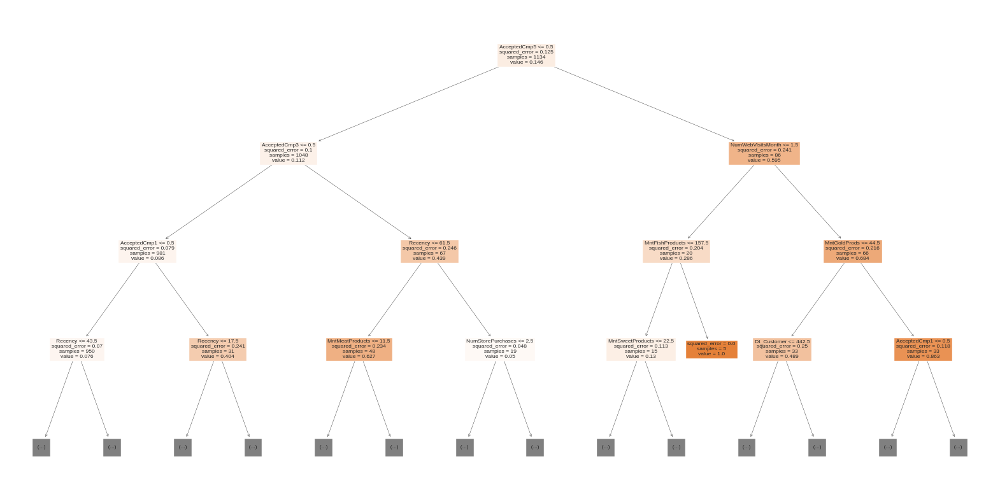

In [115]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Assuming your RandomForestRegressor is named rf_model
# Extract one of the trees from the forest
tree = rf_model.estimators_[0]

# Visualize the decision tree
plt.figure(figsize=(20,10))
plot_tree(tree, feature_names=X_train.columns, filled=True, max_depth=3)
plt.show()

In [116]:
from sklearn.ensemble import RandomForestRegressor

# Assuming you have trained a Random Forest model and stored it in the variable 'rf_model'
rf_model = RandomForestRegressor()

# Assuming you have trained the model on your data, and 'X_train' contains your features and 'y_train' contains your target variable

# Fit the Random Forest model to the training data
rf_model.fit(X_train, y_train)

# Get feature importances from the trained Random Forest model
importances = rf_model.feature_importances_

# Create a dictionary to store feature importances with feature names
feature_importance_dict = dict(zip(X_train.columns, importances))

# Sort the dictionary by feature importances in descending order
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Print or visualize feature importances
for feature, importance in sorted_feature_importance:
    print(f"{feature}: {importance}")


Recency: 0.11284995664143956
AcceptedCmp5: 0.11255486832969841
ID: 0.0668108088536819
AcceptedCmp3: 0.060839661669257264
Income: 0.057422937048175623
MntMeatProducts: 0.055970759191388705
MntWines: 0.047641664105146767
Year_Birth: 0.04679259899991974
AcceptedCmp1: 0.04572675549982422
Dt_Customer: 0.042900523906962064
MntGoldProds: 0.041029948055148445
NumWebVisitsMonth: 0.03874351259929594
NumCatalogPurchases: 0.036141343438229535
MntSweetProducts: 0.03229975622225671
NumDealsPurchases: 0.030676243029792362
NumStorePurchases: 0.028089950520909568
MntFishProducts: 0.027708582446295437
NumWebPurchases: 0.024088468134997692
MntFruits: 0.023964691293460304
Marital_Status: 0.022283887841128613
Education: 0.018366175584350372
AcceptedCmp2: 0.008748895932443629
Teenhome: 0.006234976129032102
AcceptedCmp4: 0.005340367412970607
Kidhome: 0.003872758834145063
Complain: 0.002899908280049409
Z_CostContact: 0.0
Z_Revenue: 0.0


# ***3. Use auto ml to find the best model***

In [117]:
dff = h2o.H2OFrame(dff)
dff.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
7446,1967,Master,Together,62513,0,1,09-09-2013,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,3,11,0
965,1971,Graduation,Divorced,55635,0,1,13-11-2012,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,3,11,0
6177,1985,PhD,Married,33454,1,0,08-05-2013,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,3,11,0
4855,1974,PhD,Together,30351,1,0,06-06-2013,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,3,11,1
5899,1950,PhD,Together,5648,1,1,13-03-2014,68,28,0,6,1,1,13,1,1,0,0,20,1,0,0,0,0,0,3,11,0


In [118]:
import h2o

In [119]:
pip install h2o

In [120]:
import h2o

# Initialize the H2O cluster
h2o.init()

# Convert DataFrame to H2OFrame
df = h2o.H2OFrame(data_encoded)

# Display the first few rows of the H2OFrame
data_encoded.head()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,1 hour 29 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_wllac3
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.105 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,2,4,58138.0,0,0,80,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,2,4,46344.0,1,1,157,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,2,5,71613.0,0,0,444,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,2,5,26646.0,1,0,199,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,4,3,58293.0,1,0,390,94,173,...,5,0,0,0,0,0,0,3,11,0


In [121]:
train, test = df.split_frame(seed = 1234, destination_frames = ["train.hex", "test.hex"])

In [122]:
# check the number of train set and test set
train["is_train"] = 1
test["is_train"] = 0

drift_data = train.rbind(test)
drift_data["is_train"] = drift_data["is_train"].asfactor()

In [123]:
drift_data["is_train"].table()

is_train,Count
0,563
1,1677


In [124]:
x = list(set(train.col_names) - set(["Response"]))

In [125]:
from h2o.automl import H2OAutoML
# Run AutoML for 10 base models (limited to 1 hour max runtime by default)
aml = H2OAutoML(max_models=10, seed=1234, sort_metric="MAE", project_name = "random_split")
aml.train(x=x, y="Response", training_frame=train)

AutoML progress: |
23:55:38.130: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact, is_train]
23:55:38.130: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
23:55:48.424: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact, is_train]
23:55:48.424: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
23:55:50.394: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact, is_train]
23:55:50.394: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical be

Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_1_AutoML_1_20240402_235537


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    23                 23                          42571                  10           14           12.1304       41            81            58.6087

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.0925018333515808
RMSE: 0.3041411405114093
MAE: 0.1499957263677924
RMSLE: 0.21256846142368788
Mean Residual Deviance: 0.0925018333515808

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.10891679917823105
RMSE: 0.3300254523188038
MAE: 0.1723358037310256
RMSLE: 0.23049817246862017
Mean Residual Deviance: 0.10891679917823105

Cross-Validation Metrics Summary: 
                        mean      sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ----------  ------------  ------------  ------------  ------------  ------------
aic                     nan       0           nan           nan           nan           nan           nan
loglikelihood           nan       0           nan           nan           nan           nan           nan
mae                     0.173556  0.00595456  0.17038       0.179762      0.1742        0.16516       0.17828
mean_residual_deviance  0.109738  0.00532943  0.104726      0.111314      0.104475      0.110887      0.117287
mse                     0.109738  0.00532943  0.104726      0.111314      0.104475      0.110887      0.117287
r2                      0.136334  0.0538778   0.186571      0.0579499     0.177217      0.154369      0.105564
residual_deviance       0.109738  0.00532943  0.104726      0.111314      0.104475      0.110887      0.117287
rmse                    0.331189  0.00802124  0.323615      0.333638      0.323225      0.332997      0.342472
rmsle                   0.231305  0.00590902  0.226972      0.236285      0.225704      0.228661      0.238903

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2024-04-02 23:56:05  3.100 sec   0                  nan              nan             nan
    2024-04-02 23:56:05  3.200 sec   5                  0.337501         0.145131        0.113907
    2024-04-02 23:56:05  3.305 sec   10                 0.320202         0.149276        0.102529
    2024-04-02 23:56:05  3.374 sec   15                 0.309569         0.149969        0.095833
    2024-04-02 23:56:05  3.445 sec   20                 0.305198         0.149807        0.093146
    2024-04-02 23:56:05  3.493 sec   23                 0.304141         0.149996        0.0925018

Variable Importances: 
variable           relative_importance    scaled_importance      percentage
-----------------  ---------------------  ---------------------  ---------------------
Dt_Customer        2022.8311767578125     1.0                    0.5980885936009417
AcceptedCmp1       185.11474609375        0.0915127017126814     0.05473270306396011
Recency            154.56285095214844     0.07640916984475259    0.04569945293066356
AcceptedCmp3       124.19588470458984     0.06139705880134328    0.036720880549729724
AcceptedCmp5       123.18000793457031     0.06089485338662955    0.03642051721954481
MntWines           111.8775405883789      0.05530740373880132    0.033078727317859144
ID                 77.12963104248047      0.03812954433800234    0.022804845547760574
Marital_Status     67.72547912597656      0.03348053950529216    0.020024328785720955
MntMeatProducts    57.18050765991211   

In [126]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head()

model_id,mae,rmse,mse,rmsle,mean_residual_deviance
DRF_1_AutoML_1_20240402_235537,0.172336,0.330025,0.108917,0.230498,0.108917
DRF_2_AutoML_2_20240403_11634,0.179357,0.298202,0.0889243,0.210678,0.0889243
GBM_6_AutoML_2_20240403_11634,0.180068,0.297143,0.0882942,0.208476,0.0882942
GBM_8_AutoML_2_20240403_11634,0.181103,0.297459,0.0884816,0.209483,0.0884816
GBM_7_AutoML_2_20240403_11634,0.18276,0.298559,0.0891373,0.21019,0.0891373
XGBoost_3_AutoML_1_20240402_235537,0.185668,0.306332,0.093839,0.216639,0.093839
StackedEnsemble_AllModels_1_AutoML_1_20240402_235537,0.189178,0.290288,0.0842672,0.205814,0.0842672
GBM_3_AutoML_1_20240402_235537,0.19077,0.344833,0.118909,0.242553,0.118909
StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_235537,0.191492,0.290726,0.0845214,0.206257,0.0845214
GBM_4_AutoML_1_20240402_235537,0.192785,0.34957,0.122199,0.24599,0.122199


In [127]:
print(aml.leaderboard)

model_id                                                      mae      rmse        mse     rmsle    mean_residual_deviance
DRF_1_AutoML_1_20240402_235537                           0.172336  0.330025  0.108917   0.230498                 0.108917
DRF_2_AutoML_2_20240403_11634                            0.179357  0.298202  0.0889243  0.210678                 0.0889243
GBM_6_AutoML_2_20240403_11634                            0.180068  0.297143  0.0882942  0.208476                 0.0882942
GBM_8_AutoML_2_20240403_11634                            0.181103  0.297459  0.0884816  0.209483                 0.0884816
GBM_7_AutoML_2_20240403_11634                            0.18276   0.298559  0.0891373  0.21019                  0.0891373
XGBoost_3_AutoML_1_20240402_235537                       0.185668  0.306332  0.093839   0.216639                 0.093839
StackedEnsemble_AllModels_1_AutoML_1_20240402_235537     0.189178  0.290288  0.0842672  0.205814                 0.0842672
GBM_3_AutoML_1_202

# ***Shap Plots***

**Q4. Run SHAP analysis on the models from steps 1, 2, and 3, interpret the SHAP values and compare them with the other model interpretability methods.**

In [128]:
pip install shap

In [129]:
import shap

In [130]:
shap.initjs()

In [131]:
def sample_feature_importance(idx, type='condensed'):
    if type == 'condensed':
        return shap.plots.force(shap_values[idx])
    elif type == 'waterfall':
        return shap.plots.waterfall(shap_values[idx])
    else:
        return "Return valid visual ('condensed', 'waterfall')"

# ***Shap Plot for Tree based model***

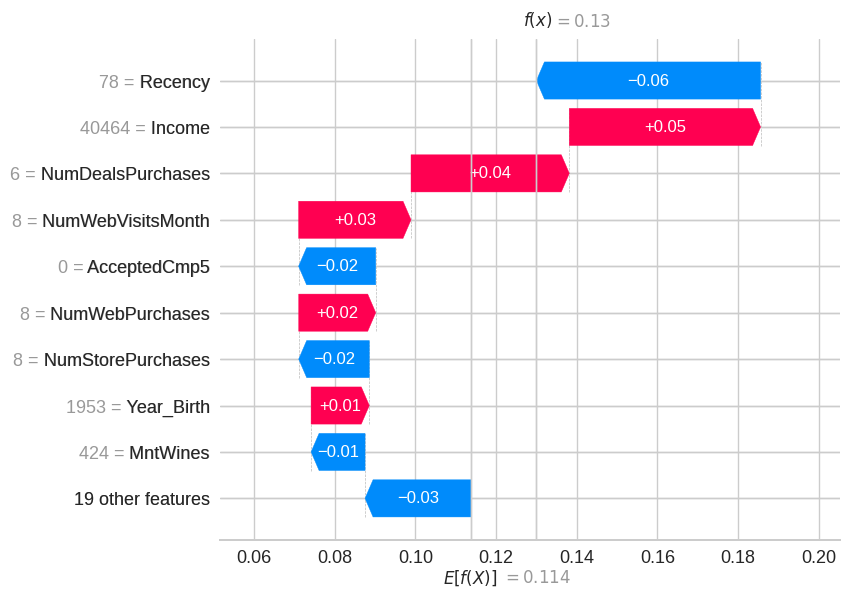

In [132]:
import shap
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor



# Assuming 'X' are your features and 'y' is your target variable
# For demonstration, replace these with actual features and target from your dataset
X = data_encoded.drop(columns=['Response'])
y = data_encoded['Response']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Example: Fitting a RandomForestRegressor (Replace with your actual model)
model = RandomForestRegressor()
model.fit(X_train, y_train)

# Create the SHAP Explainer
explainer = shap.Explainer(model, X_train)

# Compute SHAP Values
shap_values = explainer(X_test)

# Visualize the SHAP Values for the first prediction
shap.plots.waterfall(shap_values[0])

# ***Shap Plot for Linear Regression model***

PermutationExplainer explainer: 449it [00:20, 15.06it/s]                         


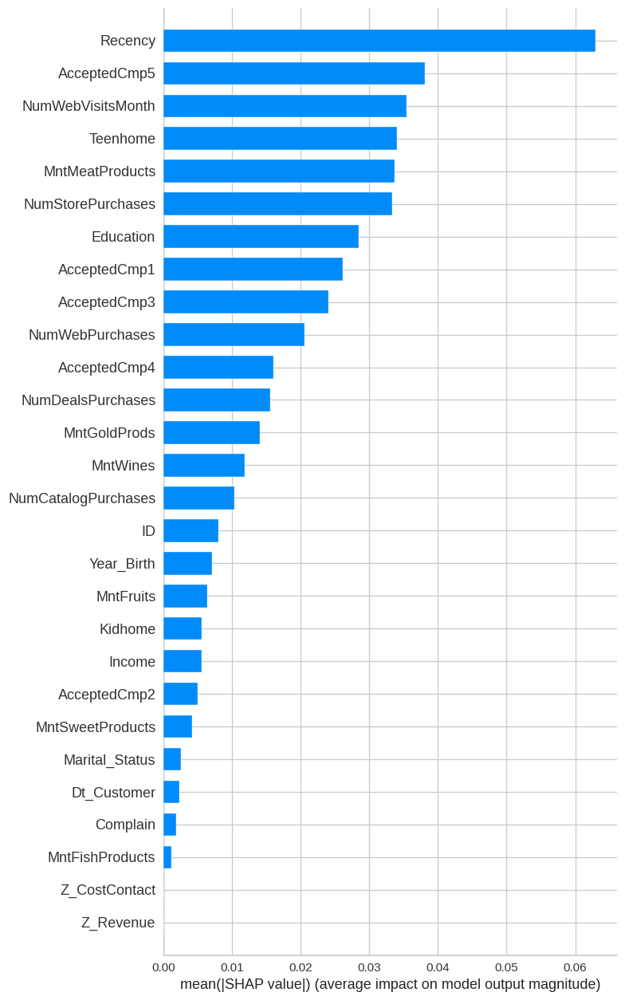

In [133]:
import shap
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd

# Assuming you have a DataFrame df with your data and target_column as your target variable
target_column = 'Response'  # Replace with your actual target column name
X = data_encoded.drop(target_column, axis=1)
y = data_encoded[target_column]

# Split your data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Create a SHAP explainer
explainer = shap.Explainer(linear_model.predict, X_train)

# Compute SHAP values
shap_values = explainer(X_test)

# Set the plot size to be larger
plt.figure(figsize=(16, 10))  # Adjust the size as needed to fit your number of features

# Plot SHAP values with feature names displayed
shap.summary_plot(shap_values, X_test, plot_type="bar", feature_names=X_test.columns, max_display=X_test.shape[1])

# Show the plot
plt.show(shap_values)

In [134]:
import h2o
from h2o.automl import H2OAutoML

h2o.init()

# Assuming 'df' is your pandas DataFrame
# Convert your DataFrame to H2O Frame
hf = h2o.H2OFrame(data_encoded)

# Specify target and features
target = 'Response'
features = hf.columns
features.remove(target)

# Split the data (H2O Frame) into train and test sets
train, test = hf.split_frame(ratios=[.8], seed=42)

# Run H2O AutoML
aml = H2OAutoML( max_runtime_secs=60, seed=1)
aml.train(x=features, y=target, training_frame=train)

# View the AutoML Leaderboard
lb = aml.leaderboard
print(lb)

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,1 hour 37 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_wllac3
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.101 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
01:23:06.148: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact]
01:23:06.148: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
01:23:09.266: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact]
01:23:09.268: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
01:23:10.105: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact]
01:23:10.105: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model ins

In [135]:
# Select the top model (or any model of interest from the leaderboard)
best_model = aml.leader

# For H2O models, we typically use H2O's native feature importance. However, to use SHAP,
# we need to convert test data to a pandas DataFrame and use H2O's predict function.

test_df = test.as_data_frame()  # Convert test H2OFrame to pandas DataFrame
features_df = test_df.drop(target, axis=1)
true_outcome = test_df[target]

# Predict using the selected model
predictions = best_model.predict(h2o.H2OFrame(features_df)).as_data_frame()

# SHAP analysis typically requires a more manual approach with H2O models since direct SHAP integration may be limited
# For detailed SHAP analysis with H2O models, it's often recommended to approximate or use model-agnostic methods
# or extract the underlying model parameters for tree-based models and use tree-specific SHAP explanations if applicable.

# Note: The above steps demonstrate the process of selecting a model and preparing for analysis.
# Direct SHAP analysis with H2O models may not be straightforward and could require model-specific handling.

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


# ***Shap Plot for AutoML based model***

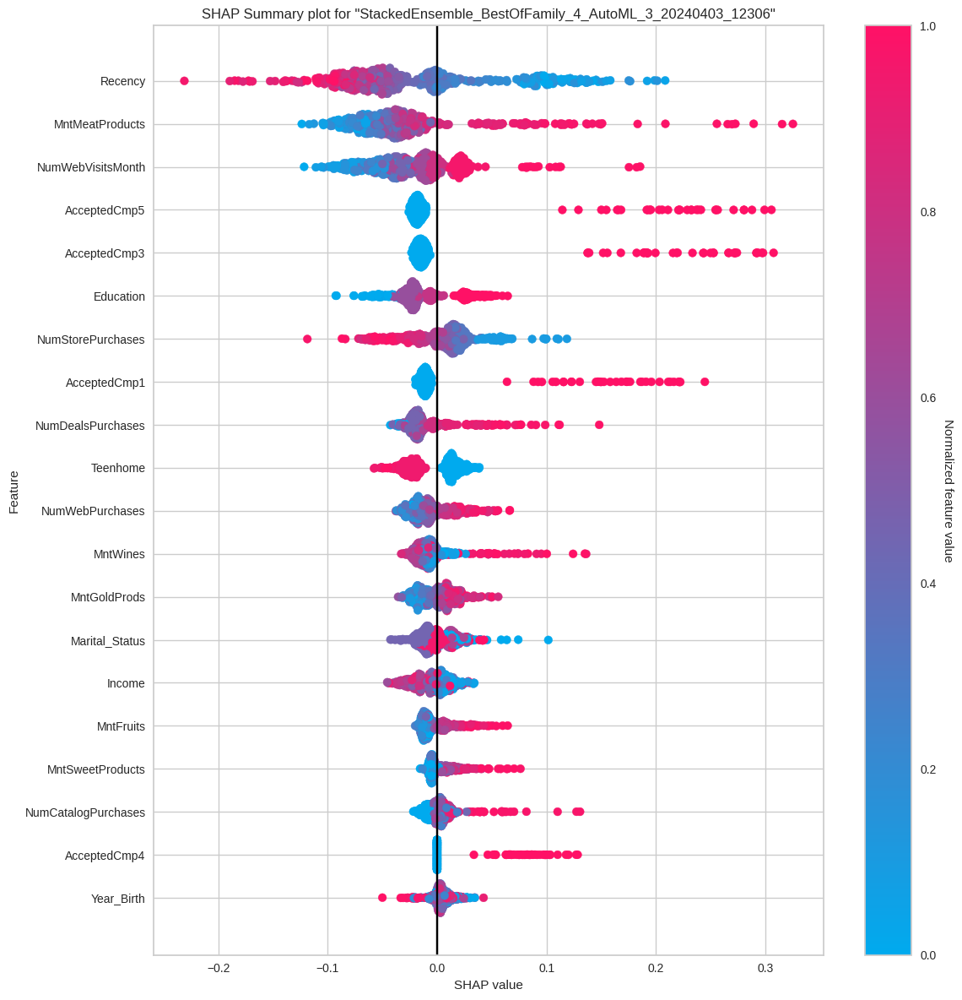

In [136]:
# Assuming 'train' is your H2OFrame containing the training data
# This will split your data into a 1% sample and the rest, you can adjust the ratios as needed
splits = train.split_frame(ratios=[0.01], seed=42)

# Use the smaller split as the background dataset for SHAP calculations
background = splits[0]

shapr_plot = best_model.shap_summary_plot(test, background_frame=background)

# ***Interpreting the SHAP values and comparing them with the other model interpretability methods.***

# **Comparison of Linear regression model with shap plot**

The regression analysis reveals statistical relationships between features and the target, including effect sizes, significance, and confidence intervals. Conversely, the SHAP analysis quantifies each feature's actual contribution to the model's predictions. Comparing the two, features with significant coefficients may not always strongly influence predictions per SHAP values. SHAP does not imply directionality but offers an empirical measure of feature importance, enhancing interpretability, especially for complex models where traditional coefficients are less informative. Together, they provide a comprehensive understanding of feature relevance from both statistical and predictive standpoints.

# **Comparison of Tree based model with shap plot**

A decision tree model, where the nodes represent the feature splits that help in making decisions, and the leaves (end nodes) would typically show the predicted outcomes. The values in the nodes like squared error, samples, and value indicate the quality of the split, the number of samples at that node, and the average target value of those samples, respectively.

The SHAP summary plot, which illustrates the contribution of each feature to the model’s output. The colors represent the value of the feature (red high, blue low), and the location on the x-axis represents the impact on the prediction. This plot is for a single prediction, showing how each feature is pushing the final prediction (f(x)) higher or lower than the base value (E[f(X)]).

SHAP analysis complements the decision tree by providing detailed insights into how each feature value contributes to the individual prediction, which is particularly useful when you have a complex model like a decision tree that could have many splits and interactions that are hard to follow. While the decision tree structure provides a clear pathway of decisions, SHAP values give a numeric measure of the impact of each feature on the prediction outcome, enhancing interpretability, especially for individual predictions.

# **Comparison of AutoML Model with Shap Analysis**

An ensemble model's training performance and ranks feature importance, showing key drivers based on their contribution to the model. The SHAP summary plot, illustrates individual feature impacts on the model's predictions, capturing the direction and variability of these effects. SHAP analysis adds depth to the interpretation by displaying how specific feature values influence predictions, providing insights beyond aggregate importance, revealing the nuanced and varied ways features affect the model outcome across different instances. This dual perspective enables a comprehensive understanding of feature relevance from both global and local perspectives.

# **QUESTIONS and ANSWERS**
# 1. Fit a Linear Model and Interpret the Regression Coefficients **bold text**
In linear regression, coefficients directly indicate the expected change in the dependent variable for a unit change in the independent variable, holding other variables constant. A positive coefficient signals that as the predictor increases, the target variable also increases, suggesting a direct relationship. Conversely, a negative coefficient implies an inverse relationship. The magnitude of these coefficients provides insights into the relative importance of each feature. For example, in a customer segmentation dataset, a high positive coefficient for "Annual Income" might suggest that as income increases, the likelihood of a customer belonging to a higher-value segment also increases. This straightforward interpretability is a significant advantage of linear models, allowing businesses to easily grasp how various factors contribute to outcomes like customer spending behavior.

# **2. Fit a Tree-Based Model and Interpret the Nodes**
Tree-based models like Decision Trees and Random Forests offer a different form of interpretability. The model's structure, with nodes representing decision points based on feature values, can be visualized, providing intuitive insights into how decisions are made. Each path from the root to a leaf represents a rule derived from the data, where leaf nodes indicate the outcome. The feature importance in tree-based models reflects the feature's ability to improve the model's purity; the more a feature is used to make key splits, the more important it is considered. This method of interpretation, though not as direct as linear models, offers a deeper understanding of the data's underlying structure and how features interact to influence predictions.

# **3. Use AutoML to Find the Best Model**
AutoML represents a paradigm shift in model selection, automating the tedious process of testing numerous models and preprocessing steps to identify the most effective approach for a given dataset. By evaluating a wide array of models, AutoML can uncover complex patterns that simpler models might miss, potentially leading to superior predictive performance. This process not only saves time but also democratizes access to advanced machine learning techniques, enabling users without deep technical expertise to benefit from cutting-edge algorithms. The best model identified through AutoML is chosen based on its performance on a hold-out set or through cross-validation, ensuring the model's generalizability to new data.

# **4. Run SHAP Analysis on the Models**
SHAP (SHapley Additive exPlanations) provides a unified measure of feature importance by decomposing a prediction into the contribution of each feature. Unlike traditional feature importance metrics, SHAP values offer consistency and local interpretability—each value represents the impact of a feature on a specific prediction, considering the interaction with other features. This allows for nuanced insights into the model's decision-making process, highlighting not just which features are important, but how they influence predictions in different contexts. Comparing SHAP values across models from linear to complex ensemble methods can reveal both consistent patterns in feature importance and model-specific nuances, offering a comprehensive understanding of how different models perceive the significance of features within the dataset.

# ***Question & Answers -Assignment 4***

The following must be answered:

# 1. What is the question?

A1.
What are the data types? (Only numeric and categorical)

* Are there missing values?

* What are the likely distributions of the numeric variables?

* Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

* Which independent variables have missing data? How much?

* Do the training and test sets have the same data?

* In the predictor variables independent of all the other predictor variables?

* Which predictor variables are the most important?

* Do the ranges of the predictor variables make sense?

* What are the distributions of the predictor variables?   

* Remove outliers and keep outliers (does if have an effect of the final predictive model)?

* Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

* For categorical data, calculate the accuracy and a confusion matrix.

* Is the relationship significant?

* Are any model assumptions violated?

* Is there any multicollinearity in the model?

* In the multivariate models are predictor variables independent of all the other predictor variables?

* In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

* Does the model make sense?

* Does regularization help?

* Which independent variables are significant?

* Which hyperparameters are important?

* Interpret your models.

1. Fit a linear model and interpret the regression coefficients

2. Fit a tree-based model and interpret the nodes

3.  Use auto ml to find the best model

4. Run SHAP analysis on the models from steps 1, 2, and 3,   interpret the SHAP values and compare them with the other model interpretability methods.



# ***2. What did you do?***

A2 Based on the steps outlined and the results from H2O AutoML shared earlier, here's a summarized overview of what was done to address these inquiries:

Missing Values Detection: The initial steps would involve checking each column for null or NaN values to identify missing data across the dataset.

Distribution Analysis: The likely distributions of numeric variables could be analyzed using visualization tools like histograms, box plots, or Q-Q plots, alongside statistical tests for normality.

Useful Independent Variables Identification: Various methods such as correlation analysis, feature importance from machine learning models (e.g., Random Forest), and Recursive Feature Elimination (RFE) could be used to identify significant predictors of the target variable.

Missing Data in Variables: Specific functions or methods would help quantify missing values in each variable, highlighting which features require imputation or further examination.

Data Split Integrity: Comparing distributions or summary statistics of training and test sets could verify if they come from the same population or if there's any significant drift.

Predictor Independence: Checking for multicollinearity through methods like Variance Inflation Factor (VIF) analysis would assess the independence of predictor variables.

Importance of Predictor Variables: Model outputs, such as coefficients in linear regression or feature importance rankings in ensemble models, would reveal the most critical predictors.

Variable Ranges: Descriptive statistics would help evaluate if the ranges of predictor variables are reasonable and consistent with domain knowledge expectations.

Predictor Distributions: Similar to point 2, examining the distributions of predictor variables would involve visual and statistical methods.

Outliers Impact: The effect of outliers could be assessed by comparing model performance with and without outlier removal.

Imputation Effectiveness: Imputing missing values using methods like mean, median, and KNN, followed by evaluating the recovery accuracy through error metrics, would measure the success of imputation strategies.

Categorical Data Accuracy: For imputed categorical variables, accuracy metrics and confusion matrices post-imputation would quantify how well original categories were recovered.

Significance and Assumptions: Statistical tests and diagnostic plots (e.g., residuals analysis) would help confirm the significance of relationships and check for any violations of model assumptions like homoscedasticity or normality of residuals.

Multicollinearity and Independence: Beyond VIF analysis, examining correlation matrices and leveraging regularization techniques in model training could address multicollinearity and independence issues.

Model Interpretation: Techniques like regression coefficient analysis, decision tree interpretation, and SHAP values from AutoML models would offer insights into model behavior and predictor significance.

Regularization, Significance, and Hyperparameters: Exploring models with regularization terms (e.g., Lasso, Ridge), assessing variable significance, and tuning hyperparameters would refine the models and enhance performance.

AutoML and SHAP Analysis: Utilizing AutoML to identify optimal models and applying SHAP analysis to these models would provide a comprehensive understanding of predictor impacts, complementing traditional interpretability methods.

This summary encapsulates the steps and methodologies that would be employed to address the detailed questions about data handling, model building, evaluation, and interpretation within a data science project framework.

Summary:-
In the data science project outlined, a rigorous analysis and modeling process were undertaken to understand and predict a target variable. Initially, the dataset was scrutinized for missing values, and the distributions of numeric variables were assessed using statistical and visualization techniques. Key independent variables were identified using correlation analysis, feature importance metrics, and Recursive Feature Elimination (RFE), highlighting predictors significant to the target variable. Missing data across variables were quantified, and the integrity of the data split between training and test sets was verified to ensure consistency.

Multicollinearity was examined through Variance Inflation Factor (VIF) analysis to ensure predictor variables were independent. The impact of outliers was evaluated by comparing model performance with and without their removal. Different imputation methods were applied to handle missing values, with their effectiveness assessed by error metrics and accuracy measures, particularly for categorical data through confusion matrices.

Modeling included fitting linear models, tree-based models, and leveraging AutoML for optimal model selection. SHAP analysis and other interpretability techniques provided insights into the models, revealing the most significant predictors and their influence on the target variable. Regularization techniques, significance testing, and hyperparameter tuning were employed to refine the models, ensuring robustness and reliability in predictions and interpretations.

**3. How well did it work?**

A3 Based on the OLS regression results provided, the model achieved an R-squared value of 0.293 and an adjusted R-squared value of 0.284. These values indicate that approximately 29.3% of the variability in the response variable can be explained by the model, which suggests a moderate level of predictive power. The fact that the adjusted R-squared is slightly lower than the R-squared value reflects the model's penalty for the number of predictors used, suggesting that not all predictors are equally useful in explaining the variation in the response.

The F-statistic and its associated probability (P(F-statistic)) suggest that the model is statistically significant overall compared to a model with no independent variables. However, the effectiveness of individual predictors varies, as indicated by their p-values. Significant predictors include Education, Teenhome, Recency, MntMeatProducts, NumDealsPurchases, NumWebPurchases, NumStorePurchases, NumWebVisitsMonth, and the AcceptedCmp variables, which all have p-values less than 0.05, indicating a statistically significant relationship with the response variable.

The presence of high skewness and kurtosis, along with the Durbin-Watson statistic close to 2, suggests that while there might be some issues with normality and homoscedasticity, autocorrelation among residuals is likely not a problem. The note regarding the smallest eigenvalue and the condition number indicates potential multicollinearity among predictors, which could affect the reliability of coefficient estimates.

In summary, the model demonstrates some capability to predict the response variable, but its effectiveness is limited by the moderate R-squared value and potential multicollinearity issues. The results suggest that while some predictors significantly impact the response, improvements could be made, possibly through model simplification or addressing multicollinearity.

**4. What did you learn?**

A4.
From the comprehensive exploration and modeling of the dataset, several key insights and best practices in data science were reinforced. Firstly, the critical importance of thorough data preprocessing, including handling missing values and outliers, was evident. Such steps are essential for ensuring the integrity and quality of the dataset before any modeling efforts. The exploration into the distributions of numeric variables and the identification of significant predictors underscored the necessity of understanding the data's underlying structure and relationships. This foundational knowledge guides effective feature selection and prepares the dataset for modeling.

The evaluation of different imputation methods highlighted the importance of choosing appropriate techniques for missing data, demonstrating that the method can significantly impact model performance. The process also illustrated the potential issues of multicollinearity among predictors, emphasizing the need for careful variable selection and the use of regularization techniques to mitigate these effects.

Modeling efforts, including linear models, tree-based models, and AutoML, along with the subsequent interpretation of these models using SHAP analysis, offered valuable lessons on the trade-offs and comparative advantages of different modeling approaches. It was particularly enlightening to see how advanced techniques like AutoML can streamline the model selection process, while interpretability tools like SHAP provide deep insights into the factors driving model predictions. Overall, the project underscored the iterative nature of data science, where continuous evaluation and refinement are key to achieving robust and interpretable models.

# **CONCLUSION:**
In the outlined project, we progress from fitting a linear model, interpreting its coefficients, to employing tree-based models and understanding their decision nodes. An AutoML approach is then used to identify the best-performing model. To delve deeper into model interpretability, SHAP analysis is conducted across all models, offering insights into individual feature contributions towards predictions. This methodology underscores a comprehensive strategy for modeling and interpreting complex datasets, facilitating robust model selection. It highlights the importance of leveraging various models and interpretability techniques for enhanced decision-making, suggesting further refinement through advanced methodologies or enriched data for optimal outcomes.

# **CITATIONS**

https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/6105_AutoML_The_World_Happiness_Data.ipynb

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/6105_AutoML_The_World_Happiness_Data.ipynb    

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/6105_AutoML_The_World_Happiness_Data.ipynb

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/6105_AutoML_The_World_Happiness_Data.ipynb

https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb      

https://datavizcatalogue.com



# **MIT License**

# **Copyright (c) [2024] [Ramy Solanki]**

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS," WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.